In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from skimage import measure


In [2]:
from PyEyeSim import EyeData


In [3]:
%load_ext autoreload
%autoreload 2

In [4]:

sizeX,sizeY=3840,2160
PathA='/Users/juliusduin/Desktop/uni_work/PointingStudyData/pointing/'

In [5]:

FixiesA=pd.read_csv('../../PointingStudyData/Lay A.csv',delimiter=';')
FixiesB=pd.read_csv('../../PointingStudyData/Lay b.csv',delimiter=';')
FixiesD=pd.read_csv('../../PointingStudyData/Deaf A.csv',delimiter=';')

FixiesD.loc[:,'RECORDING_SESSION_LABEL']=FixiesD.RECORDING_SESSION_LABEL.str.replace('A','D')


In [6]:
FixiesD.CURRENT_FIX_DURATION

0        142
1        204
2        211
3        282
4        569
        ... 
83109    151
83110     63
83111    139
83112     49
83113     16
Name: CURRENT_FIX_DURATION, Length: 83114, dtype: int64

In [7]:
FixiesA.loc[:,'group']='A'
FixiesB.loc[:,'group']='B'
FixiesD.loc[:,'group']='D'
FixiesA.loc[:,'image_1']=FixiesA.image_1.str.replace('DaVinci','Leonardo')

FixiesB.loc[:,'image_1']=FixiesB.image_1.str.replace('DaVinci','Leonardo')
FixiesD.loc[:,'image_1']=FixiesD.image_1.str.replace('DaVinci','Leonardo')


In [8]:
FixiesInterviewA=FixiesA[FixiesA.image_1.str.find('PI.jpg')>0]
FixiesSilentA=FixiesA[FixiesA.image_1.str.find('P.jpg')>0]
FixiesInterviewB=FixiesB[FixiesB.image_1.str.find('PI.jpg')>0]
FixiesSilentB=FixiesB[FixiesB.image_1.str.find('P.jpg')>0]


In [9]:

FixiesInterviewD=FixiesD[FixiesD.image_1.str.find('PI.jpg')>0]
FixiesSilentD=FixiesD[FixiesD.image_1.str.find('P.jpg')>0]
FixiesInterviewD.loc[:,'image_1']=FixiesInterviewD.image_1.str.replace('I.jpg','.jpg')


/var/folders/8m/q_qpbv793lsgvltlh5w0fp6m0000gn/T/ipykernel_71605/641328901.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  FixiesInterviewD.loc[:,'image_1']=FixiesInterviewD.image_1.str.replace('I.jpg','.jpg')
/var/folders/8m/q_qpbv793lsgvltlh5w0fp6m0000gn/T/ipykernel_71605/641328901.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FixiesInterviewD.loc[:,'image_1']=FixiesInterviewD.image_1.str.replace('I.jpg','.jpg')


In [10]:
FixiesInterviewA.loc[:,'image_1']=FixiesInterviewA.image_1.str.replace('I.jpg','.jpg')
FixiesInterviewB.loc[:,'image_1']=FixiesInterviewB.image_1.str.replace('I.jpg','.jpg')
FixiesSilentA.loc[:,'image_1']=FixiesSilentA.image_1.str.replace('I.jpg','.jpg')
FixiesSilentB.loc[:,'image_1']=FixiesSilentB.image_1.str.replace('I.jpg','.jpg')

/var/folders/8m/q_qpbv793lsgvltlh5w0fp6m0000gn/T/ipykernel_71605/2189427288.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  FixiesInterviewA.loc[:,'image_1']=FixiesInterviewA.image_1.str.replace('I.jpg','.jpg')
/var/folders/8m/q_qpbv793lsgvltlh5w0fp6m0000gn/T/ipykernel_71605/2189427288.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  FixiesInterviewA.loc[:,'image_1']=FixiesInterviewA.image_1.str.replace('I.jpg','.jpg')
/var/folders/8m/q_qpbv793lsgvltlh5w0fp6m0000gn/T/ipykernel_71605/2189427288.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  FixiesInterviewB.loc[:,'image_1']=FixiesInterviewB.image_1.str.replace('I.jpg','.jpg')
/var/folder

In [11]:
Fixies3groups=pd.concat((FixiesSilentA,FixiesSilentB,FixiesSilentD))

In [12]:
Fixies2groups=pd.concat((FixiesSilentA,FixiesSilentD))

In [13]:
Fixies2groupsAB=pd.concat((FixiesSilentA,FixiesSilentB))

In [14]:
Fixies2groups

,image_1,RECORDING_SESSION_LABEL,CURRENT_FIX_START,CURRENT_FIX_X,CURRENT_FIX_Y,CURRENT_FIX_DURATION,group
0,IsaacNP.jpg,A_p03,70,1920.0,1066.0,147,A
1,IsaacNP.jpg,A_p03,250,1808.0,688.0,134,A
2,IsaacNP.jpg,A_p03,414,1759.0,383.0,231,A
3,IsaacNP.jpg,A_p03,709,2445.0,1611.0,202,A
4,IsaacNP.jpg,A_p03,935,2561.0,1656.0,131,A
...,...,...,...,...,...,...,...
80694,SeghersP.jpg,D_p28,34215,2422.0,1377.0,733,D
80695,SeghersP.jpg,D_p28,34963,2420.0,1414.0,3515,D
80696,SeghersP.jpg,D_p28,38499,2392.0,1437.0,37,D
80697,SeghersP.jpg,D_p28,38554,2377.0,1532.0,633,D


In [15]:
Fixies3groups['pointing']=True
Fixies3groups.loc[Fixies3groups['image_1'].str.contains('NP.jpg'),'pointing']=False


Fixies2groups['pointing']=True
Fixies2groups.loc[Fixies2groups['image_1'].str.contains('NP.jpg'),'pointing']=False


In [16]:
SilentAD=EyeData('IntDat','Between',Fixies2groups,sizeX,sizeY)
SilentAD.DataInfo(Stimulus='image_1',subjectID='RECORDING_SESSION_LABEL',mean_x='CURRENT_FIX_X',mean_y='CURRENT_FIX_Y',FixDuration='CURRENT_FIX_DURATION',StimPath=PathA)


dataset size:  (110582, 8)
study design:  Between
presentation size:  x= 3840 pixels y= 2160  pixels
presentation size:  x= 3840 pixels y= 2160  pixels
Stimulus  not found !!, provide column as Stimulus =YourColumn , default:  Stimulus
subjectID  not found !!, provide column as subjectID =YourColumn , default:  subjectID
mean_x  not found !!, provide column as mean_x =YourColumn , default:  mean_x
mean_y  not found !!, provide column as mean_y =YourColumn , default:  mean_y
info found for 66 subjects, and 16 stimuli
!y size incosistency warning expected 2160 vs actual (2132, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2132, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2160, 2283, 3)
!y size incosistency warning expected 2160 vs actual (1918, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (1918, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2160, 2208, 3)
!x size incosistency warning, expected 3840 vs actual (2160,

In [18]:
SilentAB=EyeData('IntDat','Between',Fixies2groupsAB,sizeX,sizeY)
SilentAB.DataInfo(Stimulus='image_1',subjectID='RECORDING_SESSION_LABEL',mean_x='CURRENT_FIX_X',mean_y='CURRENT_FIX_Y',FixDuration='CURRENT_FIX_DURATION',StimPath=PathA)


dataset size:  (140861, 7)
study design:  Between
presentation size:  x= 3840 pixels y= 2160  pixels
presentation size:  x= 3840 pixels y= 2160  pixels
Stimulus  not found !!, provide column as Stimulus =YourColumn , default:  Stimulus
subjectID  not found !!, provide column as subjectID =YourColumn , default:  subjectID
mean_x  not found !!, provide column as mean_x =YourColumn , default:  mean_x
mean_y  not found !!, provide column as mean_y =YourColumn , default:  mean_y
info found for 85 subjects, and 32 stimuli
!y size incosistency warning expected 2160 vs actual (2132, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2132, 2880, 3)
!y size incosistency warning expected 2160 vs actual (2132, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2132, 2880, 3)
!x size incosistency warning, expected 3840 vs actual (2160, 2283, 3)
!x size incosistency warning, expected 3840 vs actual (2160, 2283, 3)
!y size incosistency warning expected 2160 vs actual (1918, 

Data for  66 observers and  16  stimuli.
Mean fixation number:  104.72  +/-  18.32
Mean fixation duration:  345.4  +/-  74.6 msec
Num of trials with zero fixations: 0
Num valid trials  1056
Mean X location:  1973.8  +/-  61.9  pixels
Mean Y location:  1001.0  +/-  75.4  pixels
Mean saccade  amplitude:  345.7  +/-  61.4  pixels
Mean scanpath  length:  35417.9  +/-  7091.3  pixels


(array(['BorgianniNP.jpg', 'CaravaggioP.jpg', 'ChampaigneNP.jpg',
        'DujardinP.jpg', 'ElymasP.jpg', 'GiorgioneP.jpg', 'IsaacNP.jpg',
        'LeonardoNP.jpg', 'LuiniP.jpg', 'NavarretteNP.jpg',
        'RaphaelNP.jpg', 'RembrandtP.jpg', 'RomboutsNP.jpg',
        'SeghersP.jpg', 'VerdierP.jpg', 'VerrocchioNP.jpg'], dtype=object),
 array(['A_p03', 'A_p05', 'A_p06', 'A_p116', 'A_p119', 'A_p15', 'A_p18',
        'A_p19', 'A_p20', 'A_p22', 'A_p23', 'A_p24', 'A_p31', 'A_p32',
        'A_p35', 'A_p36', 'A_p37', 'A_p45', 'A_p47', 'A_p48', 'A_p54',
        'A_p55', 'A_p65', 'A_p66', 'A_p67', 'A_p69', 'A_p70', 'A_p71',
        'A_p72', 'A_p73', 'A_p75', 'A_p76', 'A_p85', 'A_p86', 'A_p87',
        'A_p88', 'A_p89', 'A_p90', 'A_p96', 'A_p97', 'A_p98', 'A_p99',
        'D_06', 'D_p01', 'D_p02', 'D_p03', 'D_p04', 'D_p05', 'D_p08',
        'D_p09', 'D_p10', 'D_p11', 'D_p13', 'D_p14', 'D_p16', 'D_p17',
        'D_p18', 'D_p19', 'D_p20', 'D_p22', 'D_p23', 'D_p24', 'D_p25',
        'D_p26', 'D_p27'

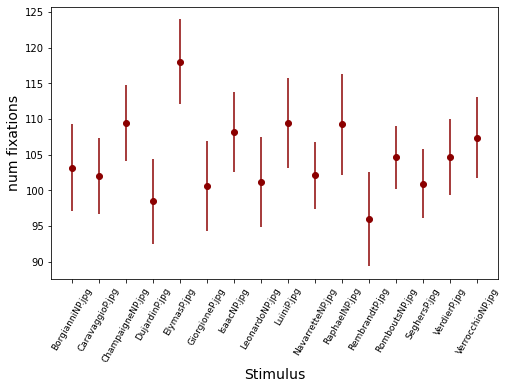

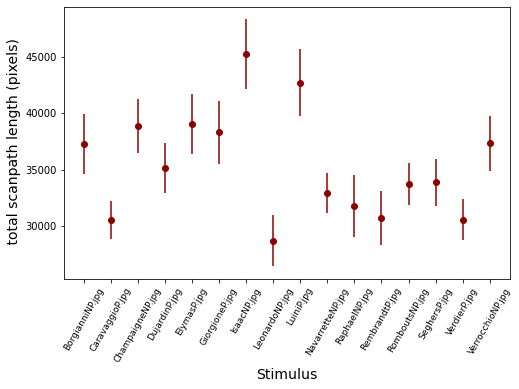

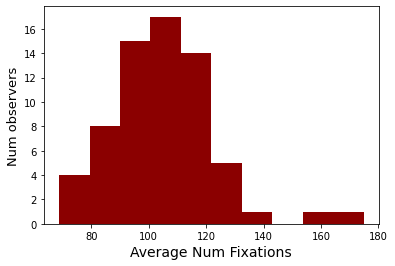

In [19]:
SilentAD.RunDescriptiveFix(Visual=1,duration=1)

Data for  85 observers and  32  stimuli.
Mean fixation number:  103.57  +/-  15.72
Mean fixation duration:  350.3  +/-  70.0 msec
Num of trials with zero fixations: 0
Num valid trials  1360
Mean X location:  1969.3  +/-  57.9  pixels
Mean Y location:  991.6  +/-  75.7  pixels
Mean saccade  amplitude:  351.7  +/-  54.6  pixels
Mean scanpath  length:  36002.0  +/-  7501.8  pixels


(array(['BorgianniNP.jpg', 'BorgianniP.jpg', 'CaravaggioNP.jpg',
        'CaravaggioP.jpg', 'ChampaigneNP.jpg', 'ChampaigneP.jpg',
        'DujardinNP.jpg', 'DujardinP.jpg', 'ElymasNP.jpg', 'ElymasP.jpg',
        'GiorgioneNP.jpg', 'GiorgioneP.jpg', 'IsaacNP.jpg', 'IsaacP.jpg',
        'LeonardoNP.jpg', 'LeonardoP.jpg', 'LuiniNP.jpg', 'LuiniP.jpg',
        'NavarretteNP.jpg', 'NavarretteP.jpg', 'RaphaelNP.jpg',
        'RaphaelP.jpg', 'RembrandtNP.jpg', 'RembrandtP.jpg',
        'RomboutsNP.jpg', 'RomboutsP.jpg', 'SeghersNP.jpg', 'SeghersP.jpg',
        'VerdierNP.jpg', 'VerdierP.jpg', 'VerrocchioNP.jpg',
        'VerrocchioP.jpg'], dtype=object),
 array(['A_p03', 'A_p05', 'A_p06', 'A_p116', 'A_p119', 'A_p15', 'A_p18',
        'A_p19', 'A_p20', 'A_p22', 'A_p23', 'A_p24', 'A_p31', 'A_p32',
        'A_p35', 'A_p36', 'A_p37', 'A_p45', 'A_p47', 'A_p48', 'A_p54',
        'A_p55', 'A_p65', 'A_p66', 'A_p67', 'A_p69', 'A_p70', 'A_p71',
        'A_p72', 'A_p73', 'A_p75', 'A_p76', 'A_p85', 'A_p8

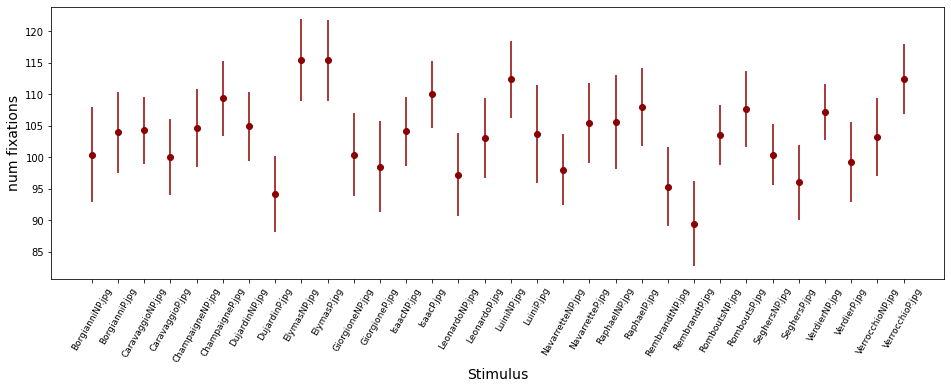

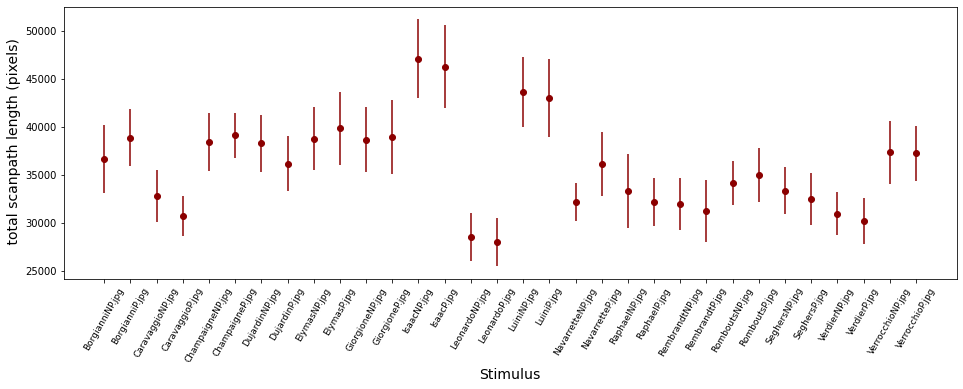

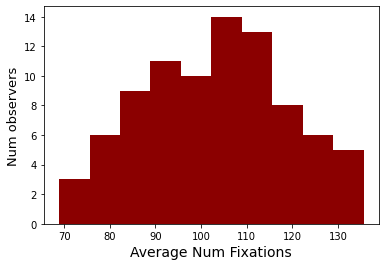

In [20]:
SilentAB.RunDescriptiveFix(Visual=1,duration=1)

In [21]:
import seaborn as sns
import matplotlib.image as mpimg
from scipy.signal import argrelextrema
from scipy.ndimage import generate_binary_structure, binary_erosion, maximum_filter, gaussian_filter
from scipy.spatial import distance
from skimage.transform import resize
from icecream import ic

def detect_peaks(image):
    """
    Takes an image and detect the peaks usingthe local maximum filter.
    Returns a boolean mask of the peaks (i.e. 1 when
    the pixel's value is the neighborhood maximum, 0 otherwise)
    """

    # define an 8-connected neighborhood
    neighborhood = generate_binary_structure(2,2)

    # apply the local maximum filter; all pixel of maximal value
    # in their neighborhood are set to 1
    local_max = maximum_filter(image, footprint=neighborhood) == image
    # local_max is a mask that contains the peaks we are
    # looking for, but also the background.
    # In order to isolate the peaks we must remove the background from the mask.
    # we create the mask of the background
    background = (image == 0)

    # a little technicality: we must erode the background in order to
    # successfully subtract it form local_max, otherwise a line will
    # appear along the background border (artifact of the local maximum filter)
    eroded_background = binary_erosion(background, structure=neighborhood, border_value=1)

    # we obtain the final mask, containing only peaks,
    # by removing the background from the local_max mask (xor operation)
    detected_peaks = local_max ^ eroded_background

    return detected_peaks

def extract_focus_peaks(x_coords, y_coords, dimensions, sal=25,):
    LocalSalMapRaw = np.zeros((dimensions[0], dimensions[1]))
    numberOfFixations = len(x_coords)
    # counter for fixations that are outside of the image
    OutsideOfFrame = 0
    # pointer to fixation values
    FixationsX = np.intp(np.round(x_coords))
    FixationsY = np.intp(np.round(y_coords))

    # count up fixation coordinates in a dim x dim np array
    for i in range(numberOfFixations):
        try:
            LocalSalMapRaw[FixationsY[i], FixationsX[i]] += 1
        except:
            OutsideOfFrame+=1
    LocalSalMap = gaussian_filter(LocalSalMapRaw, sal)
    
    finalHeatmap = LocalSalMap.copy()
    LocalSalMapRaw = LocalSalMapRaw.transpose()

    detectedPeaks = detect_peaks(LocalSalMap.transpose())

    finalSalMap = LocalSalMap.transpose()
    
    finalSalMap[~detectedPeaks] = 0
    
    # Flattening the array and finding the 5th highest number
    minSaliency = np.partition(finalSalMap.flatten(), -5)[-5]

    # Setting all values of arr lower than the threshold to 0.
    finalSalMap[finalSalMap < minSaliency] = 0
    focus_x, focus_y = np.where(finalSalMap > 0)
    
    return focus_x, focus_y, finalHeatmap

In [24]:
SilentAD.FixCountCalc(SAMPLE_IMG)

stimns found: [15] VerrocchioNP.jpg


array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
u = 8/0

In [23]:
test_images = Fixies2groups.image_1.unique()
ic(test_images)
SAMPLE_IMG = test_images[-6]
ic(SAMPLE_IMG)
bg_img = mpimg.imread('/Users/juliusduin/Desktop/uni_work/PointingStudyData/pointing/'+SAMPLE_IMG)

ic| test_images: array(['IsaacNP.jpg', 'RaphaelNP.jpg', 'RomboutsNP.jpg',
                        'CaravaggioP.jpg', 'VerdierP.jpg', 'NavarretteNP.jpg',
                        'LeonardoNP.jpg', 'BorgianniNP.jpg', 'SeghersP.jpg',
                        'GiorgioneP.jpg', 'VerrocchioNP.jpg', 'LuiniP.jpg', 'ElymasP.jpg',
                        'ChampaigneNP.jpg', 'DujardinP.jpg', 'RembrandtP.jpg'],
                       dtype=object)
ic| SAMPLE_IMG: 'VerrocchioNP.jpg'


In [ ]:
xs1 = (sizeX-np.shape(bg_img)[1])/2
xs2=sizeX-xs1
ys1=(sizeY-np.shape(bg_img)[0])/2
ys2=sizeY-ys1
xs1,ys2


(905.0, 2160.0)

In [ ]:
test_df = Fixies2groups[Fixies2groups.image_1 == SAMPLE_IMG].copy()
test_df.loc[:, 'mean_x'] = test_df.CURRENT_FIX_X-xs1
test_df.loc[:, 'mean_y'] = test_df['CURRENT_FIX_Y'] - ys1

In [ ]:
Fixies2groups.columns

Index(['image_1', 'RECORDING_SESSION_LABEL', 'CURRENT_FIX_START',
       'CURRENT_FIX_X', 'CURRENT_FIX_Y', 'CURRENT_FIX_DURATION', 'group',
       'pointing'],
      dtype='object')

In [ ]:
test_df_groupa = test_df[test_df.group == 'A']
test_df_groupd = test_df[test_df.group == 'D']
test_df_groupa.head()
test_df.to_csv('../test_data/fixCountTest.csv')

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


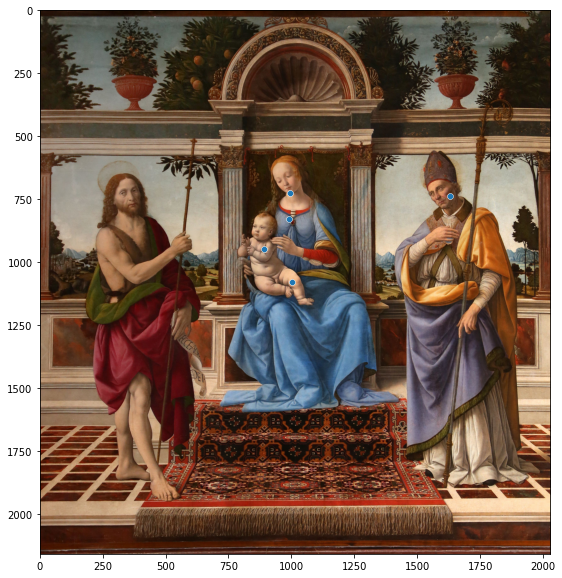

In [ ]:
plt.figure(figsize=(10,10))

height, width, channels = bg_img.shape
plt.imshow(bg_img)
#sns.scatterplot(test_df_groupd.mean_x, test_df_groupd.mean_y)
xs, ys, heatmap = extract_focus_peaks(test_df_groupd.mean_x, test_df_groupd.mean_y, [height, width], sal=25)
sns.scatterplot(xs, ys)
#plt.imshow(heatmap, alpha=.4)
heatmap_deaf = resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100))
#plt.imshow(resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100)), alpha=.4)

ic| currentImg: 'VerrocchioNP.jpg'
ic| currentImg: 'LuiniP.jpg'
ic| currentImg: 'ElymasP.jpg'
ic| currentImg: 'ChampaigneNP.jpg'
ic| currentImg: 'DujardinP.jpg'
ic| currentImg: 'RembrandtP.jpg'


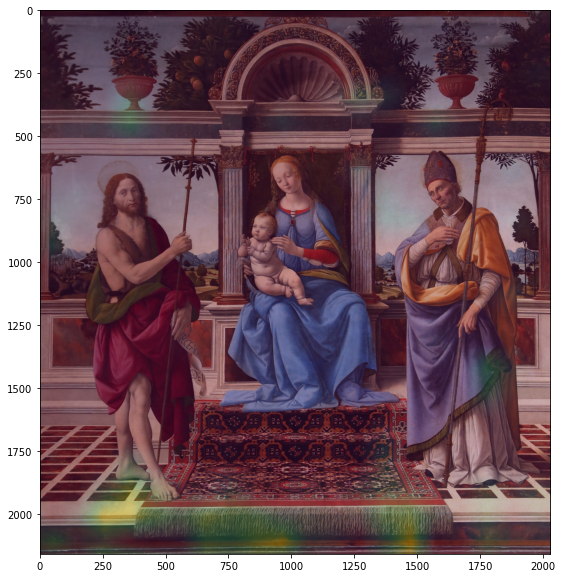

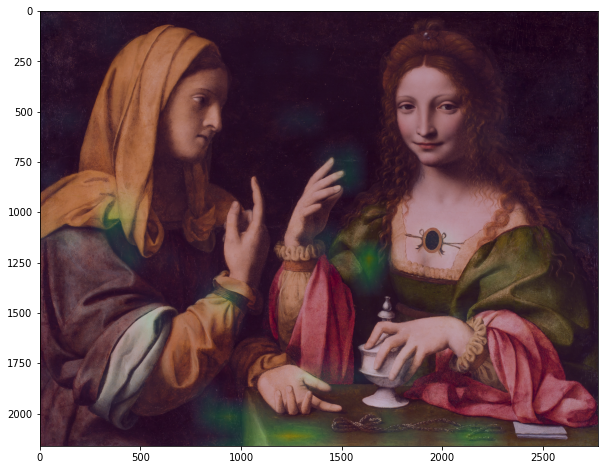

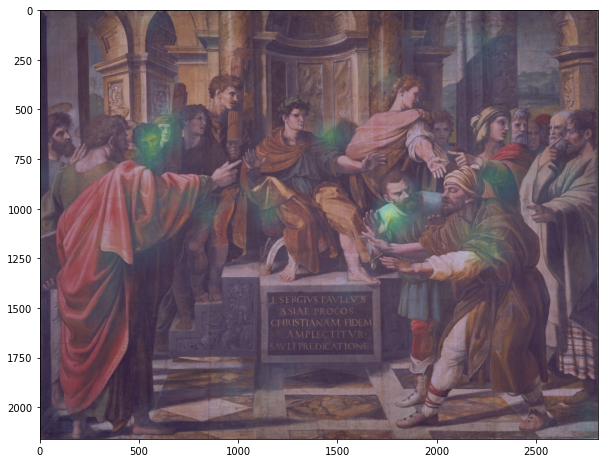

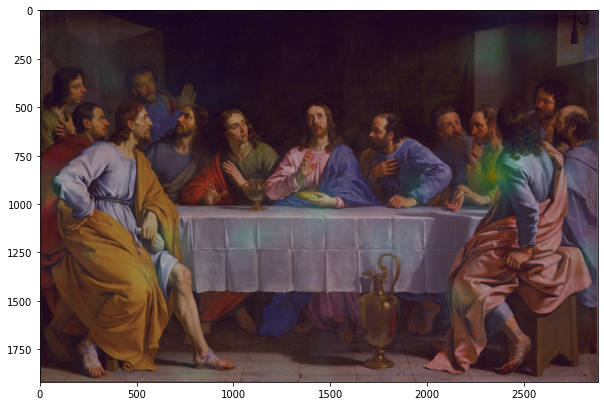

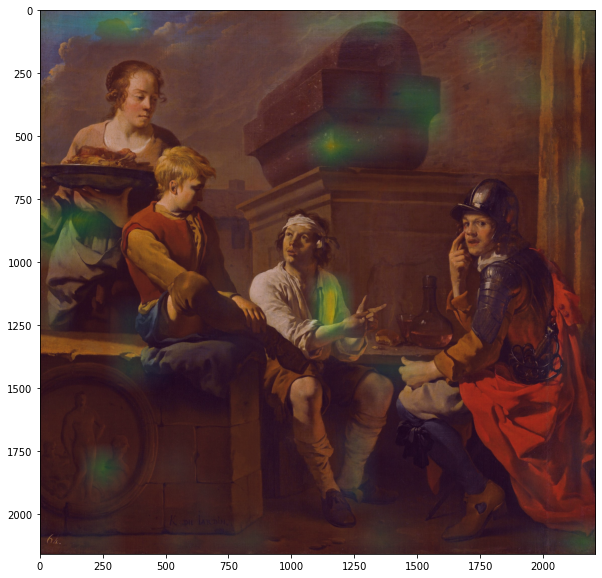

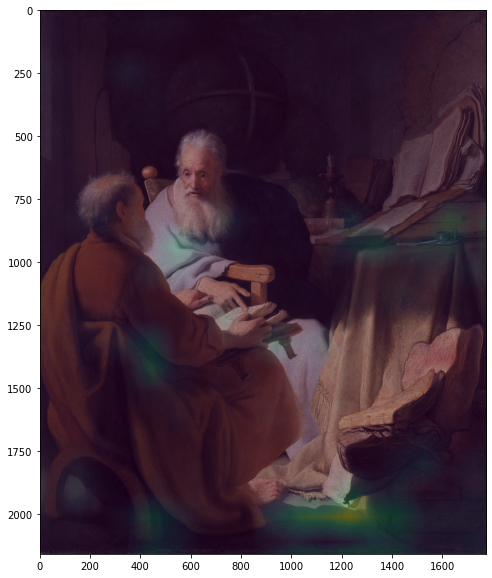

In [ ]:
for idx, currentImg in enumerate(test_images):
    if idx < 10:
        continue;
    ic(currentImg)
    bg_img = mpimg.imread('/Users/juliusduin/Desktop/uni_work/PointingStudyData/pointing/'+currentImg)
    test_df = Fixies2groups[Fixies2groups.image_1 == currentImg].copy()
    test_df.loc[:, 'mean_x'] = test_df.CURRENT_FIX_X-xs1
    test_df.loc[:, 'mean_y'] = test_df['CURRENT_FIX_Y'] - ys1

    test_df_groupa = test_df[test_df.group == 'A']
    test_df_groupd = test_df[test_df.group == 'D']

    height, width, channels = bg_img.shape

    xs, ys, heatmap = extract_focus_peaks(test_df_groupd.mean_x, test_df_groupd.mean_y, [height, width], sal=25)

    heatmap_deaf = resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100))

    xs, ys, heatmap = extract_focus_peaks(test_df_groupa.mean_x, test_df_groupa.mean_y, [height, width], sal=25)

    heatmap_control = resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100))

    heatmap_deaf_minus_control = heatmap_deaf - heatmap_control

    # Replace negative values with 0
    heatmap_deaf_minus_control[heatmap_deaf_minus_control < 0] = 0
    plt.figure(figsize=(10, 10))
    plt.imshow(bg_img)
    plt.imshow(resize(heatmap_deaf_minus_control, (height, width)), alpha=.3)

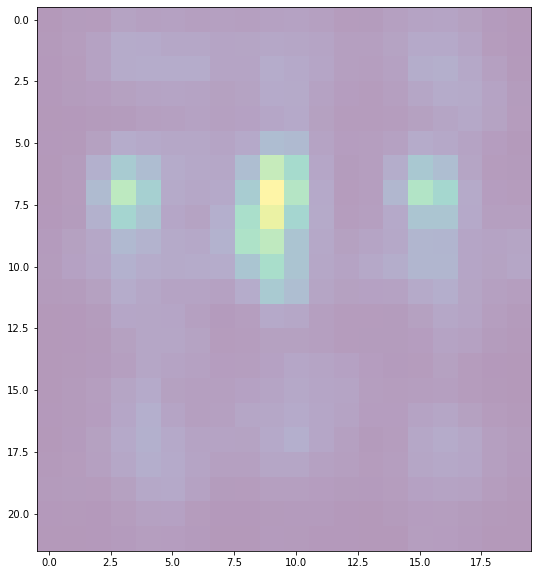

In [ ]:
plt.figure(figsize=(10,10))
bg_img = mpimg.imread('/Users/juliusduin/Desktop/uni_work/PointingStudyData/pointing/'+ SAMPLE_IMG)
height, width, channels = bg_img.shape
#plt.imshow(bg_img)
#sns.scatterplot(test_df_groupd.mean_x, test_df_groupd.mean_y)
xs, ys, heatmap = extract_focus_peaks(test_df_groupa.mean_x, test_df_groupa.mean_y, [height, width], sal=25)
sns.scatterplot(x=xs, y=ys)
plt.imshow(resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100)), alpha=.4)
heatmap_control = resize(heatmap, (heatmap.shape[0]/100, heatmap.shape[1]/100))

In [ ]:
np.corrcoef(heatmap_deaf.flatten(), heatmap_control.flatten(), rowvar=False)

array([[1.        , 0.94290923],
       [0.94290923, 1.        ]])

In [ ]:
print(np.max(heatmap_control))

0.010394025529870133


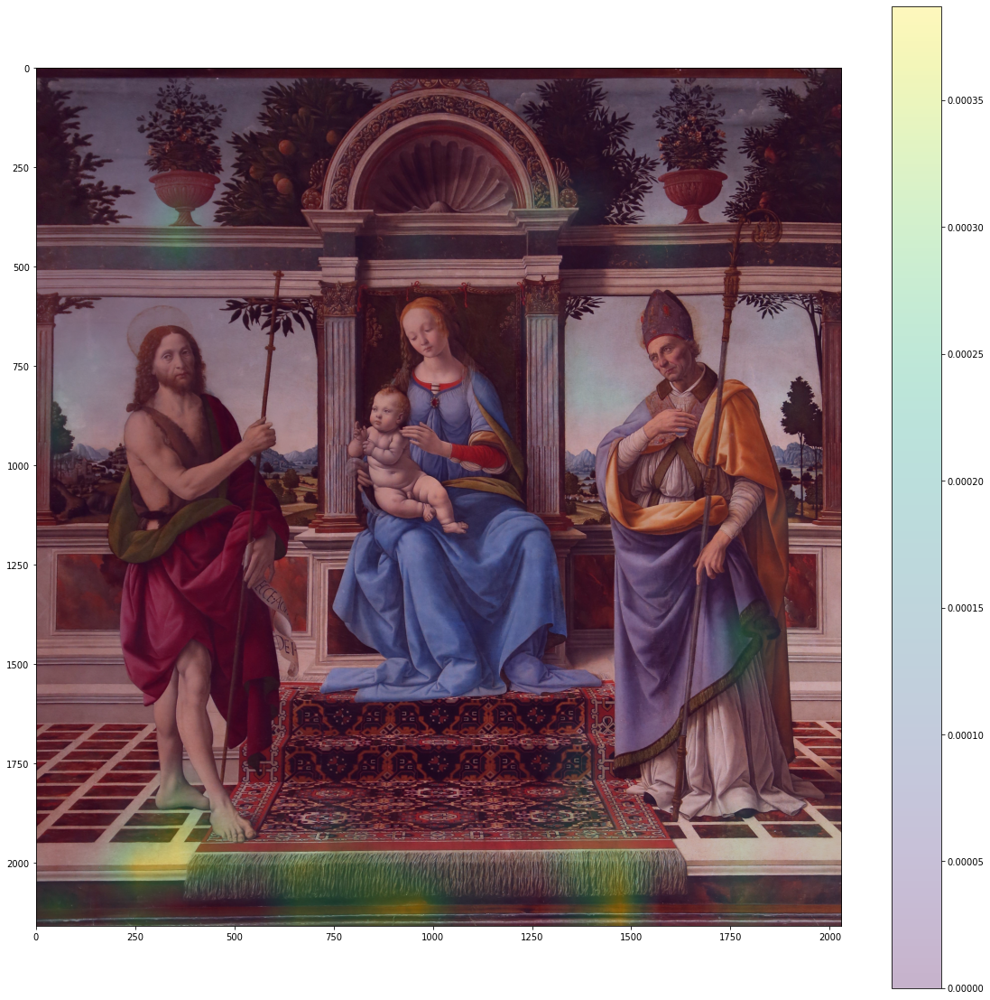

In [ ]:
heatmap_deaf_minus_control = heatmap_deaf - heatmap_control

# Replace negative values with 0
heatmap_deaf_minus_control[heatmap_deaf_minus_control < 0] = 0
plt.figure(figsize=(20, 20))
plt.imshow(bg_img)
plt.imshow(resize(heatmap_deaf_minus_control, (height, width)), alpha=.3)
plt.colorbar()
plt.show()

In [ ]:
c = 8/0

ZeroDivisionError: division by zero

Conditions ['A' 'D']
Data for  66 observers and  16  stimuli.
Mean fixation number:  104.72  +/-  18.32
fixation duration not asked for
Num of trials with zero fixations: 0
Num valid trials  1056
Mean X location:  1973.8  +/-  61.9  pixels
Mean Y location:  1001.0  +/-  75.4  pixels
Mean saccade  amplitude:  345.7  +/-  61.4  pixels
Mean scanpath  length:  35417.9  +/-  7091.3  pixels
stimns found: [3] DujardinP.jpg
dimensions= (66, 2160, 3840)


KeyboardInterrupt: 

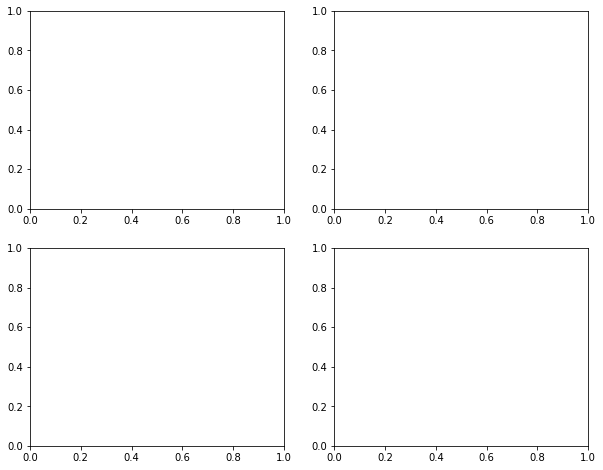

In [ ]:
SilentAD.CompareGroupsHeatmap(SilentAD.stimuli[3],'group',center=True,SD=40,cmap='inferno',alpha=.6)

stimns found: [0 1] ['BorgianniNP.jpg' 'BorgianniP.jpg']
Conditions ['A' 'B']
stimns found: [0 1] ['BorgianniNP.jpg' 'BorgianniP.jpg']
dimensions= (85, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 43
0 A BorgianniNP.jpg
1 B BorgianniP.jpg
100 permutations starting


(31.40073163508443,
 0.4520545018184859,
 array([0.48307955, 0.49193749, 0.45648498, 0.39742217, 0.39591618,
        0.35828389, 0.3563111 , 0.34938623, 0.36787779, 0.32663683,
        0.41549342, 0.36908469, 0.35929779, 0.45647961, 0.31073835,
        0.36299928, 0.41081015, 0.37751886, 0.34905011, 0.30908661,
        0.34749198, 0.38917132, 0.34755584, 0.36526792, 0.37134791,
        0.32062614, 0.40991571, 0.35453034, 0.39095238, 0.3898593 ,
        0.35140882, 0.3824064 , 0.30619425, 0.31646913, 0.35370972,
        0.40142985, 0.42089016, 0.36376016, 0.33906112, 0.3807298 ,
        0.33491076, 0.37002793, 0.37876509, 0.37258682, 0.454266  ,
        0.34670751, 0.40072728, 0.31730412, 0.31956339, 0.3910425 ,
        0.33919354, 0.36194925, 0.40513516, 0.32482987, 0.41596758,
        0.30769184, 0.36117662, 0.39232688, 0.31315295, 0.35268144,
        0.39691953, 0.41665802, 0.43034299, 0.39620568, 0.40771697,
        0.55850622, 0.33776671, 0.37426558, 0.3842809 , 0.35322329,
       

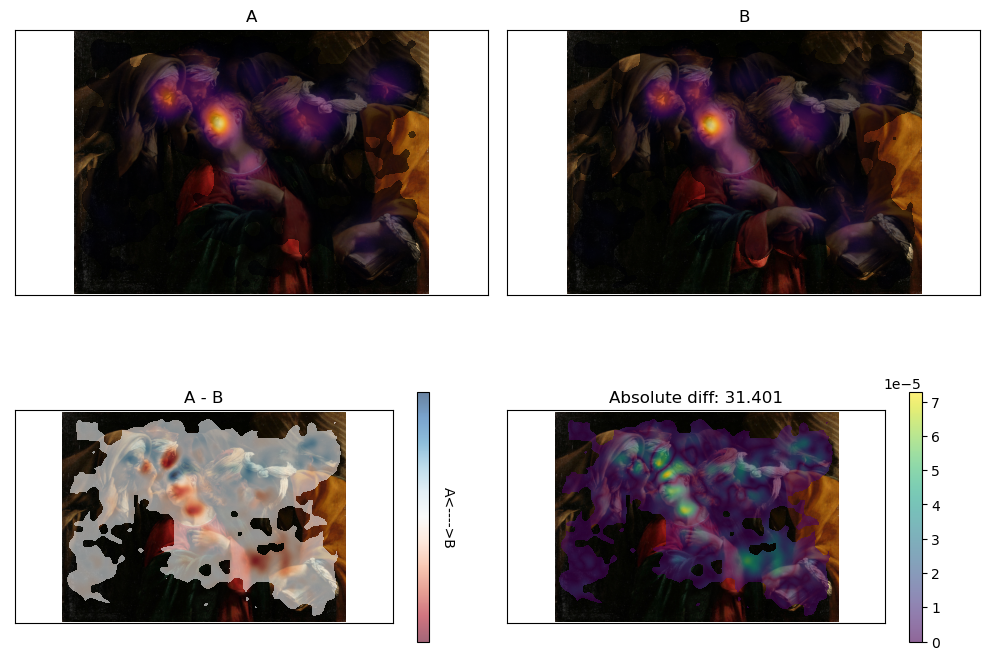

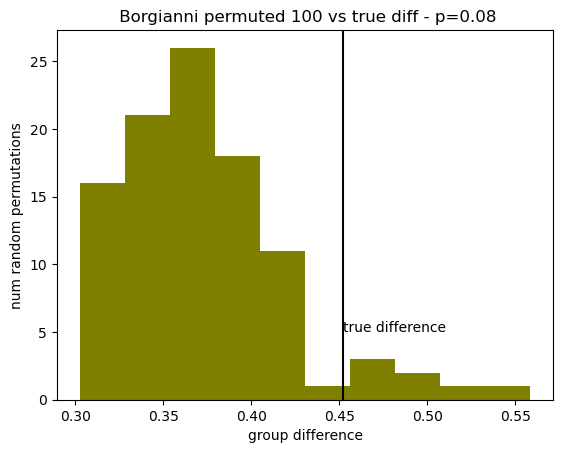

In [ ]:
SilentAB.CompareGroupsHeatmap('Borgianni','group',center=True,SD=40,cmap='inferno',alpha=.6,substring=True)

In [ ]:
?SilentAD.CompareGroupsHeatmap

Conditions ['A' 'D']
stimns found: [1] CaravaggioP.jpg
dimensions= (66, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 24
0 A CaravaggioP.jpg
1 D CaravaggioP.jpg
100 permutations starting


(39.80454341391454,
 0.49051202335817606,
 array([0.37191237, 0.38057706, 0.27302502, 0.37288098, 0.37540978,
        0.33457525, 0.42561027, 0.40395319, 0.31542246, 0.37161358,
        0.4390382 , 0.30952306, 0.38184122, 0.32944683, 0.37045882,
        0.36050066, 0.32842846, 0.45781083, 0.40244072, 0.40804738,
        0.30619546, 0.36776767, 0.38019264, 0.38946969, 0.39734393,
        0.37504552, 0.32902694, 0.42845552, 0.32125484, 0.414821  ,
        0.40712431, 0.3667559 , 0.42157995, 0.35213878, 0.40873407,
        0.31267505, 0.43857614, 0.37710506, 0.46313411, 0.33573204,
        0.33390843, 0.38594935, 0.37146947, 0.34182301, 0.34158804,
        0.40738634, 0.36767837, 0.36785624, 0.36143627, 0.43832469,
        0.40534381, 0.30820326, 0.35741006, 0.34179588, 0.37661794,
        0.43028388, 0.33646523, 0.4684843 , 0.34921412, 0.3271986 ,
        0.33847268, 0.33549563, 0.31031164, 0.40562616, 0.3868639 ,
        0.45061753, 0.32337066, 0.36497931, 0.43594035, 0.30906096,
      

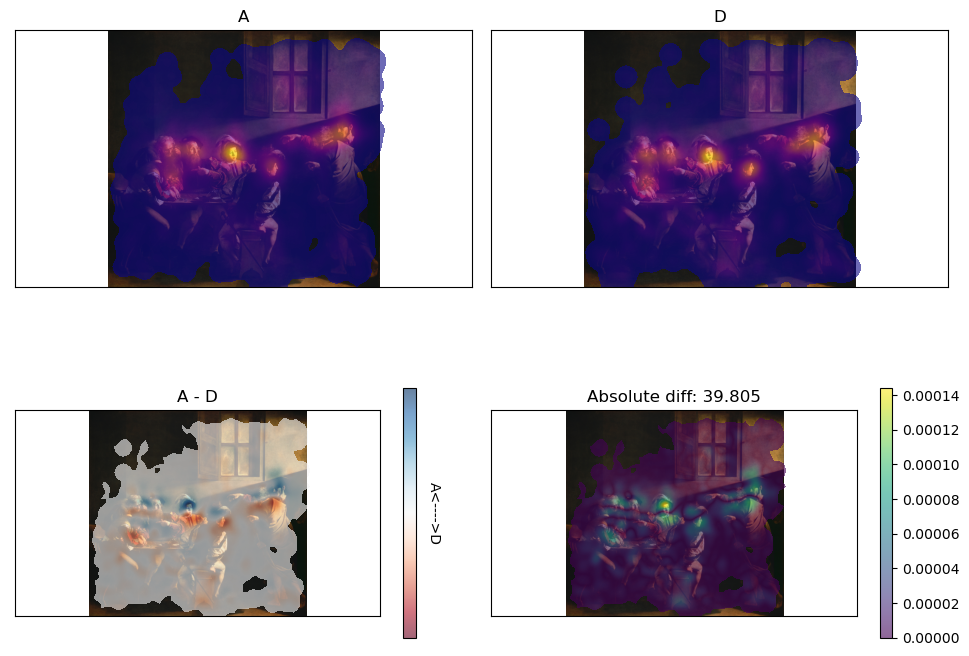

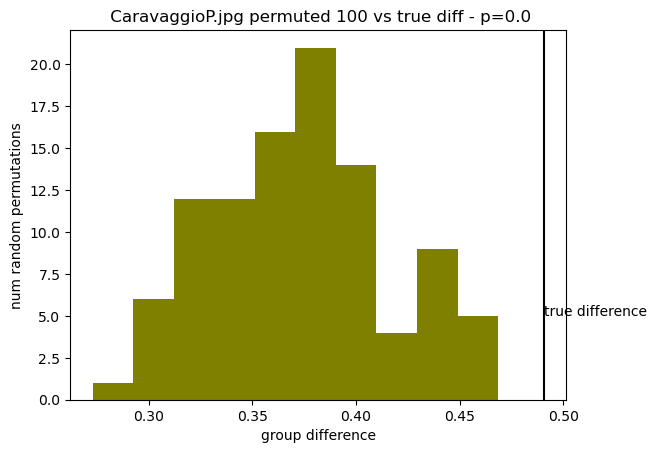

In [ ]:
SilentAD.CompareGroupsHeatmap(SilentAD.stimuli[1],'group',center=True,SD=40,cmap='plasma',alpha=.6)

Conditions ['A' 'D']
stimns found: [13] SeghersP.jpg
dimensions= (66, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 24
0 A SeghersP.jpg
1 D SeghersP.jpg
100 permutations starting


(39.31842235801208,
 0.5255467419692251,
 array([0.38659203, 0.43770575, 0.36992359, 0.32317392, 0.35806354,
        0.42164603, 0.41618438, 0.43396366, 0.4223295 , 0.38673631,
        0.39440575, 0.36781766, 0.32606097, 0.4258421 , 0.5011771 ,
        0.36352998, 0.39720402, 0.47401009, 0.40933952, 0.37973738,
        0.4376622 , 0.40773238, 0.41395597, 0.42559177, 0.41800919,
        0.36300583, 0.3999571 , 0.44244208, 0.40876484, 0.37092895,
        0.40028522, 0.47661187, 0.46729821, 0.364534  , 0.43246794,
        0.41316897, 0.42738353, 0.50892474, 0.34439749, 0.51202155,
        0.39187115, 0.4315054 , 0.33942364, 0.35841098, 0.3867914 ,
        0.36386904, 0.36067904, 0.35456787, 0.4259438 , 0.45483532,
        0.40985897, 0.39288522, 0.44142179, 0.51862707, 0.43388624,
        0.36699117, 0.48455488, 0.42286704, 0.37840736, 0.38889102,
        0.41708364, 0.42328418, 0.37624006, 0.40389841, 0.36673151,
        0.48440906, 0.38787511, 0.42761146, 0.39763052, 0.36515527,
       

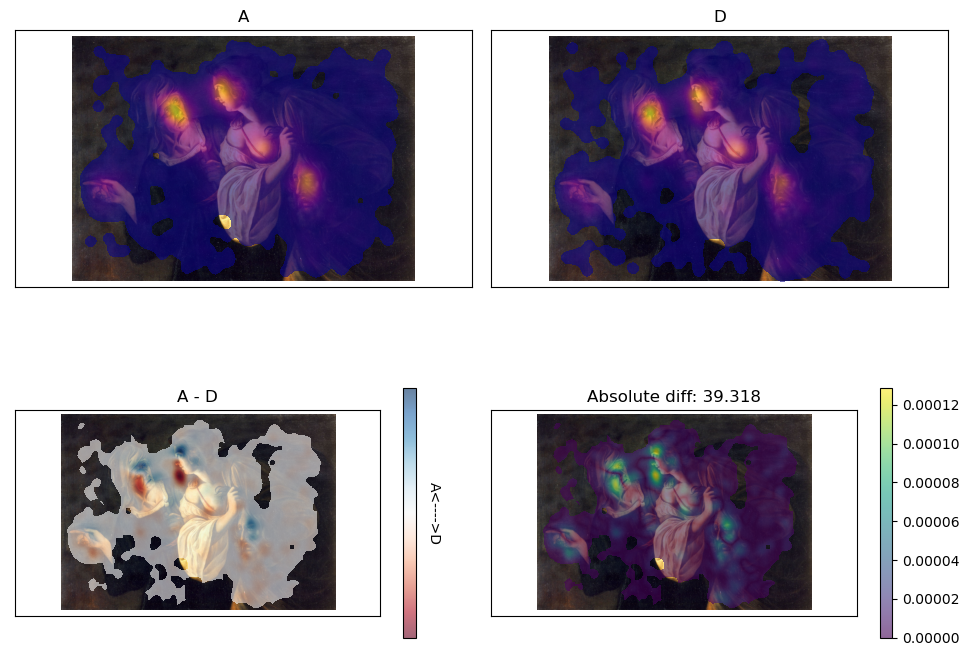

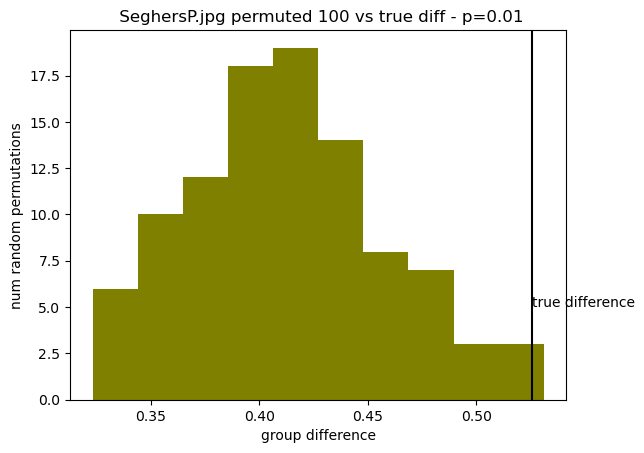

In [ ]:
SilentAD.CompareGroupsHeatmap('SeghersP.jpg','group',center=True,SD=40,cmap='plasma',alpha=.6)

stimns found: [2 3] ['CaravaggioNP.jpg' 'CaravaggioP.jpg']
Conditions ['A' 'B']
stimns found: [2 3] ['CaravaggioNP.jpg' 'CaravaggioP.jpg']
dimensions= (85, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 43
0 A CaravaggioP.jpg
1 B CaravaggioNP.jpg
250 permutations starting


(30.499089293165976,
 0.3823053862448995,
 array([0.29910247, 0.28171999, 0.35434841, 0.25403183, 0.26807794,
        0.37598266, 0.42336323, 0.37067382, 0.3105911 , 0.28920291,
        0.27907318, 0.32171056, 0.28750917, 0.28789707, 0.26958384,
        0.32691547, 0.33188818, 0.40718695, 0.3947017 , 0.30959561,
        0.31176094, 0.31619706, 0.29956549, 0.32145424, 0.3033549 ,
        0.27607095, 0.299553  , 0.33916801, 0.38137512, 0.36416107,
        0.29539326, 0.36636758, 0.36273147, 0.39991634, 0.3386428 ,
        0.31307019, 0.33098818, 0.29629887, 0.27194839, 0.31251265,
        0.33567074, 0.30197498, 0.33968942, 0.29472939, 0.35740545,
        0.27969207, 0.28637635, 0.42398844, 0.33422822, 0.34977479,
        0.32913849, 0.2988819 , 0.31721186, 0.2556531 , 0.32252233,
        0.34419422, 0.28775542, 0.33470346, 0.29651578, 0.32966925,
        0.30223529, 0.32419107, 0.29009524, 0.29051725, 0.2755069 ,
        0.34790084, 0.29425796, 0.29001143, 0.29670366, 0.35553058,
      

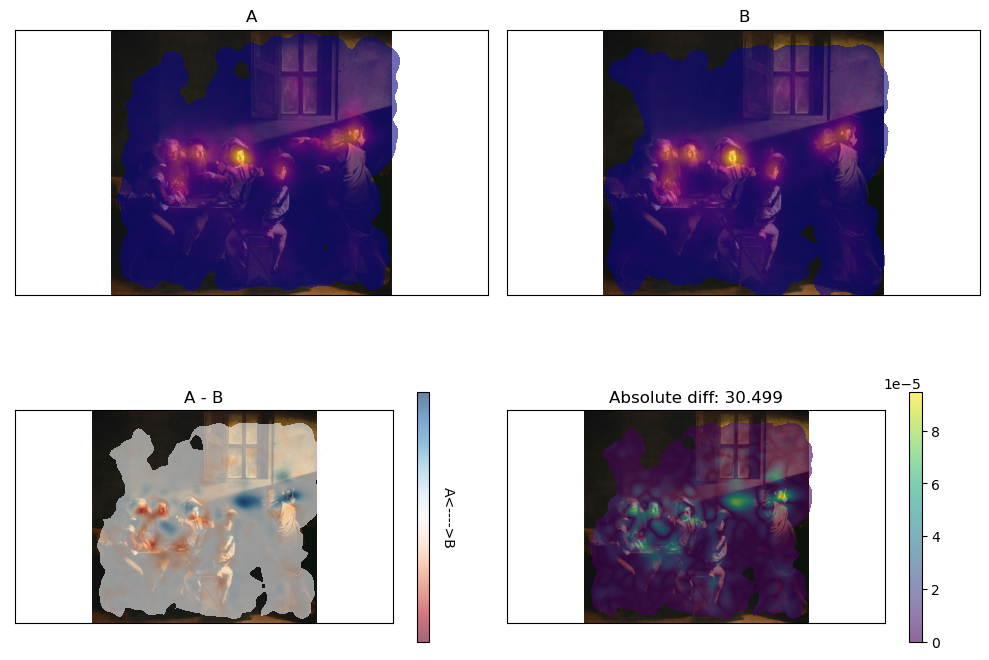

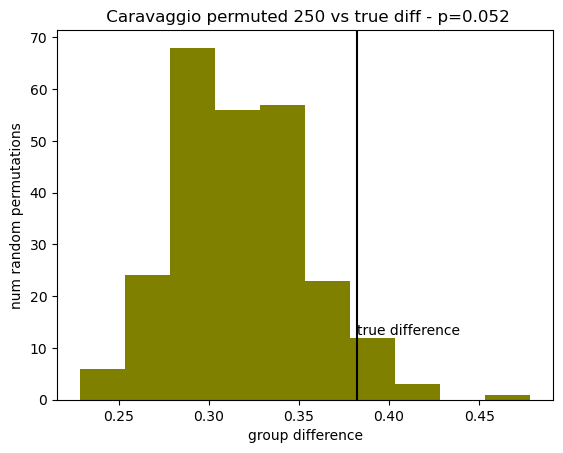

In [ ]:
SilentAB.CompareGroupsHeatmap('Caravaggio','group',center=True,SD=40,cmap='plasma',alpha=.6,substring=True, Nrand=250)

In [ ]:
SilentAD.stimuli

array(['BorgianniNP.jpg', 'CaravaggioP.jpg', 'ChampaigneNP.jpg',
       'DujardinP.jpg', 'ElymasP.jpg', 'GiorgioneP.jpg', 'IsaacNP.jpg',
       'LeonardoNP.jpg', 'LuiniP.jpg', 'NavarretteNP.jpg',
       'RaphaelNP.jpg', 'RembrandtP.jpg', 'RomboutsNP.jpg',
       'SeghersP.jpg', 'VerdierP.jpg', 'VerrocchioNP.jpg'], dtype='<U16')

In [ ]:
fixcounts=SilentAD.FixCountCalc(SilentAD.stimuli[1],CutAct=1)


stimns found: [1] CaravaggioP.jpg


stimns found: [1] CaravaggioP.jpg


array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

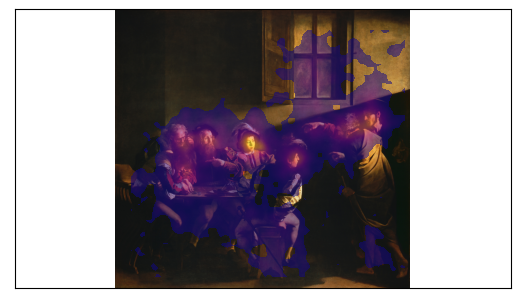

In [ ]:
SilentAD.Heatmap(SilentAD.stimuli[1],Vis=True,CutArea=1,center=True)

Conditions ['A' 'D']
Data for  66 observers and  16  stimuli.
Mean fixation number:  104.72  +/-  18.32
fixation duration not asked for
Num of trials with zero fixations: 0
Num valid trials  1056
Mean X location:  1973.8  +/-  61.9  pixels
Mean Y location:  1001.0  +/-  75.4  pixels
Mean saccade  amplitude:  345.7  +/-  61.4  pixels
Mean scanpath  length:  35417.9  +/-  7091.3  pixels
stimns found: [2] ChampaigneNP.jpg
dimensions= (66, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 24
0 A ChampaigneNP.jpg
1 D ChampaigneNP.jpg
100 permutations starting


(51.84070516106167,
 0.7368615087306868,
 array([0.37525655, 0.41611557, 0.45010545, 0.36564184, 0.45657225,
        0.38638834, 0.43150278, 0.43115271, 0.38840865, 0.44371964,
        0.44150948, 0.50100175, 0.4422536 , 0.38910607, 0.53600016,
        0.37117794, 0.40790661, 0.44203462, 0.46887388, 0.45861091,
        0.38439049, 0.52457131, 0.46437258, 0.39750876, 0.42901383,
        0.42012779, 0.39779159, 0.38214379, 0.31864436, 0.45211879,
        0.36183973, 0.37160596, 0.38755249, 0.38548887, 0.4662991 ,
        0.44071191, 0.49448077, 0.38073354, 0.45782041, 0.47050359,
        0.43748857, 0.38735259, 0.40732069, 0.4805304 , 0.44782598,
        0.40557614, 0.52292451, 0.40020509, 0.41330235, 0.39954257,
        0.45373622, 0.49116248, 0.43408521, 0.45635191, 0.42457281,
        0.43519508, 0.43297696, 0.53734948, 0.39009347, 0.44436548,
        0.40004652, 0.46793945, 0.37255145, 0.38185047, 0.38786697,
        0.52612768, 0.38989494, 0.5266889 , 0.4225599 , 0.38838706,
       

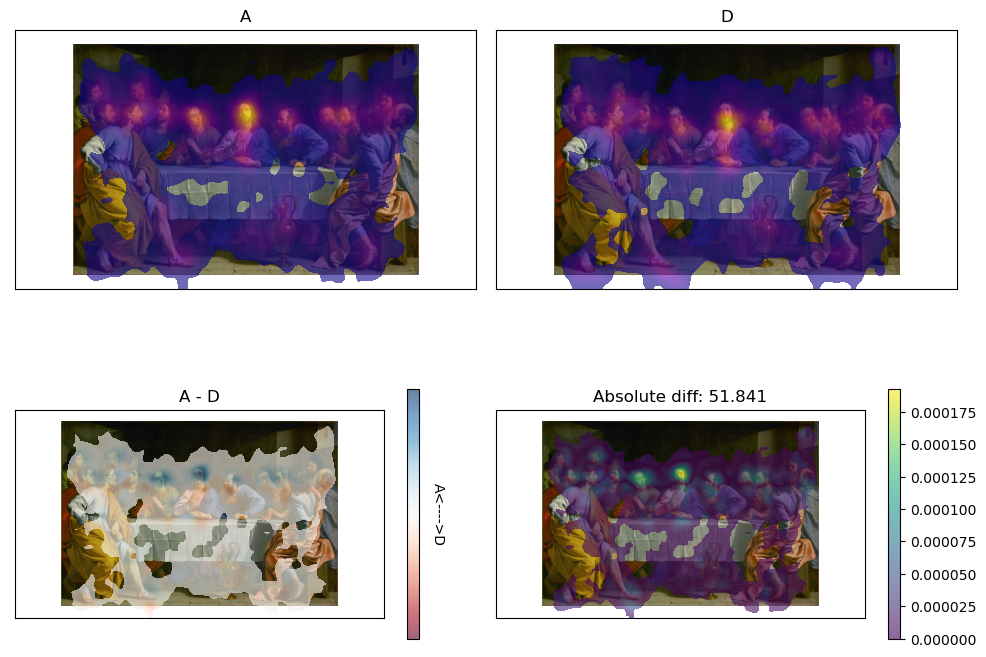

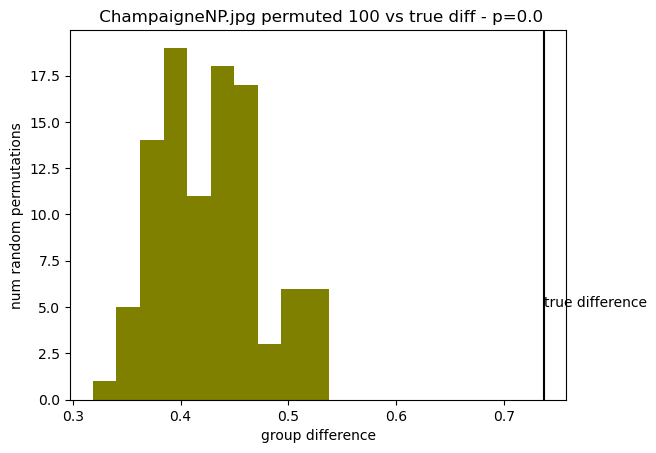

In [ ]:
SilentAD.CompareGroupsHeatmap(SilentAD.stimuli[2],'group',center=True,SD=40,cmap='plasma',alpha=.6)

stimns found: [4 5] ['ChampaigneNP.jpg' 'ChampaigneP.jpg']
Conditions ['A' 'B']
Data for  85 observers and  32  stimuli.
Mean fixation number:  103.57  +/-  15.72
fixation duration not asked for
Num of trials with zero fixations: 0
Num valid trials  1360
Mean X location:  1969.3  +/-  57.9  pixels
Mean Y location:  991.6  +/-  75.7  pixels
Mean saccade  amplitude:  351.7  +/-  54.6  pixels
Mean scanpath  length:  36002.0  +/-  7501.8  pixels
stimns found: [4 5] ['ChampaigneNP.jpg' 'ChampaigneP.jpg']
dimensions= (85, 2160, 3840)
num observers in group 1: 42
num observers in group 2: 43
0 A ChampaigneNP.jpg
1 B ChampaigneP.jpg
100 permutations starting


(28.086642607973577,
 0.38122064426941127,
 array([0.31912522, 0.30743871, 0.29668031, 0.39989479, 0.36418594,
        0.3469558 , 0.42251662, 0.35357039, 0.3508205 , 0.35517219,
        0.35278725, 0.30538139, 0.32663257, 0.31557532, 0.42591785,
        0.35778913, 0.31981483, 0.35244493, 0.3865784 , 0.40661899,
        0.31434051, 0.33016527, 0.31485694, 0.37296674, 0.38155875,
        0.34944791, 0.38817318, 0.38512635, 0.37209779, 0.37394482,
        0.33552593, 0.33965667, 0.32729133, 0.35063424, 0.33043877,
        0.41220879, 0.36328374, 0.33962   , 0.39890294, 0.30524911,
        0.4667169 , 0.33699177, 0.36986212, 0.34194699, 0.3699322 ,
        0.36435988, 0.34512764, 0.30711086, 0.33409927, 0.35929764,
        0.35496073, 0.38502005, 0.31521098, 0.36640215, 0.32906402,
        0.33353253, 0.38839099, 0.37690465, 0.31973219, 0.37136104,
        0.32109801, 0.36011908, 0.40761272, 0.36052849, 0.31849929,
        0.27726233, 0.30491711, 0.50671994, 0.35174796, 0.34704758,
     

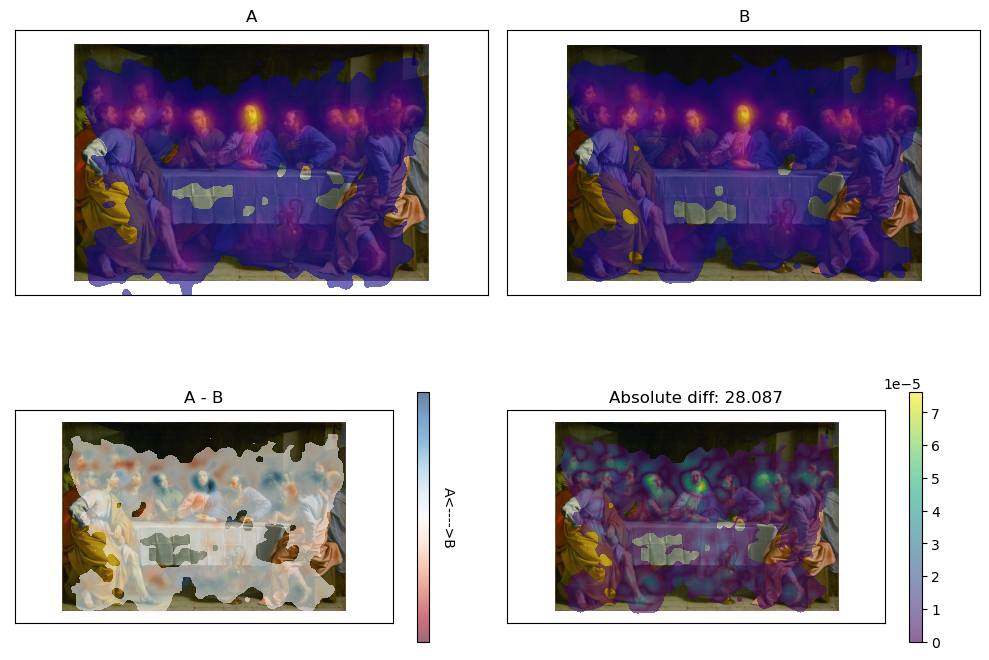

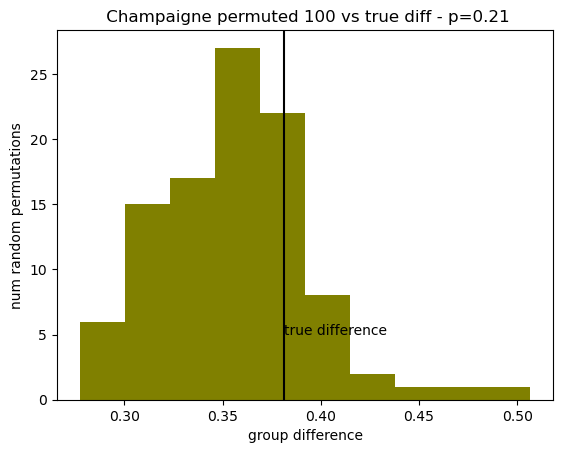

In [ ]:
SilentAB.CompareGroupsHeatmap('Champaigne','group',center=True,SD=40,cmap='plasma',alpha=.6,substring=True)

Conditions ['A' 'D']
stimns found: [4] ElymasP.jpg
dimensions= (66, 2112, 2749)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A ElymasP.jpg
1 D ElymasP.jpg
100 permutations starting


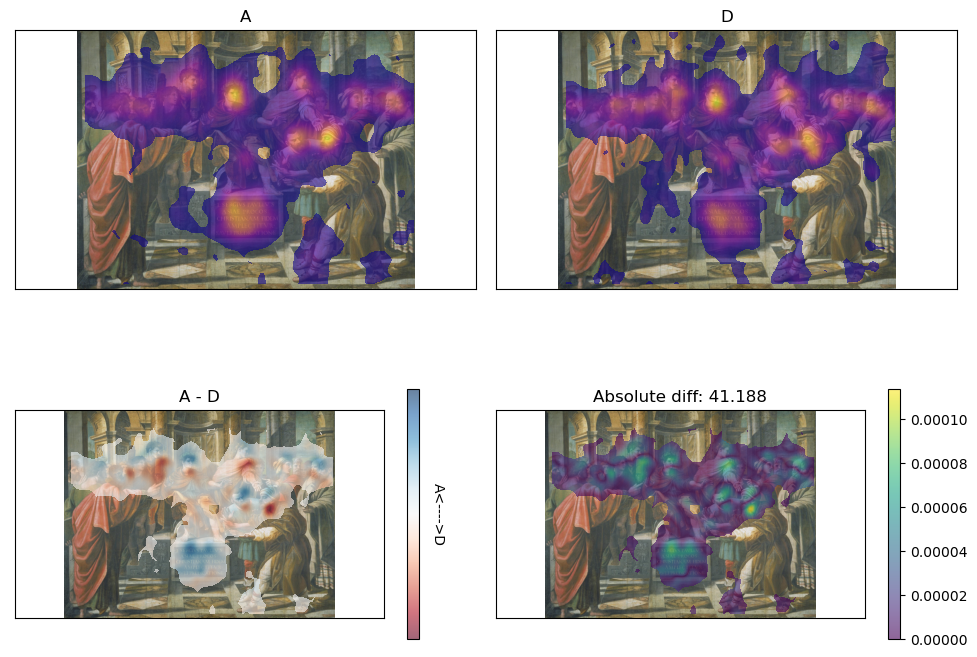

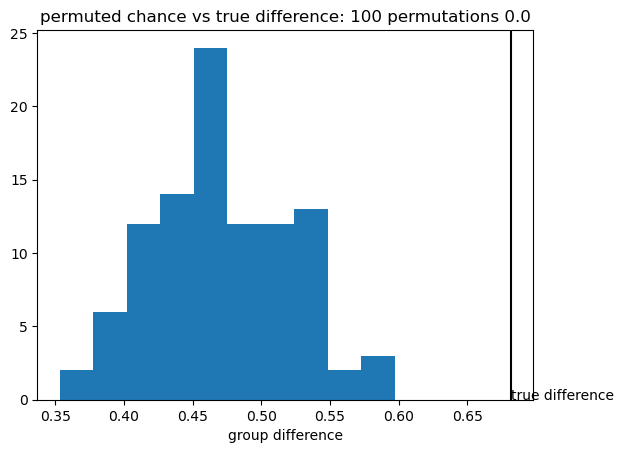

In [ ]:
diff,reddif,permdiff=SilentAD.CompareGroupsHeatmap(SilentAD.stimuli[4],'group',center=True,SD=40,cmap='plasma',alpha=.6,CutArea=True)

stimns found: [8 9] ['ElymasNP.jpg' 'ElymasP.jpg']
Conditions ['A' 'B']
stimns found: [8 9] ['ElymasNP.jpg' 'ElymasP.jpg']
dimensions= (85, 2010, 2730)
num observers in group 1: 42
num observers in group 2: 43
0 A ElymasP.jpg


ValueError: could not broadcast input array from shape (2010,2730) into shape (2115,3262)

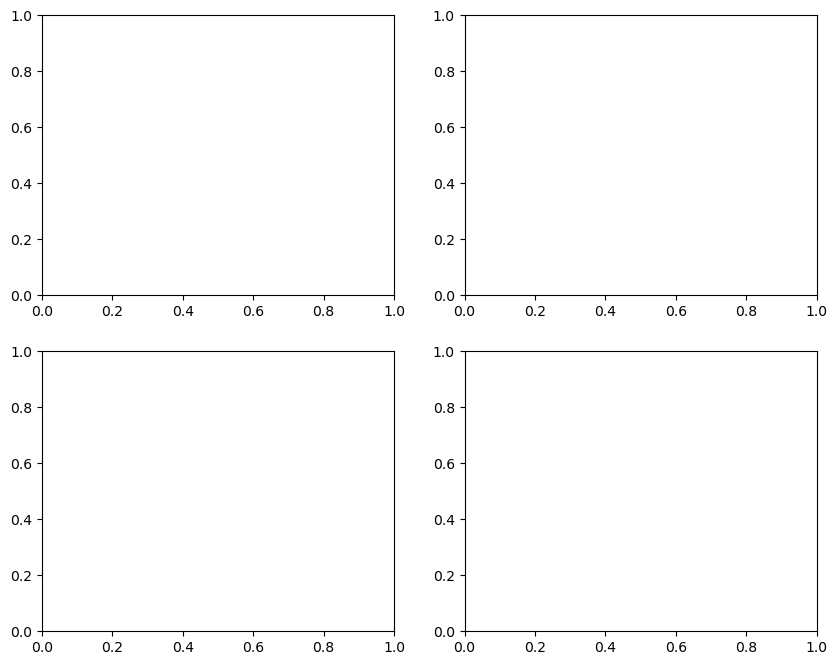

In [ ]:
diff,reddif,permdiff=SilentAB.CompareGroupsHeatmap('Elymas','group',center=True,SD=40,cmap='plasma',alpha=.6,CutArea=True,substring=True)

Conditions ['A' 'D']
stimns found: [0] BorgianniNP.jpg
dimensions= (66, 2014, 2733)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A BorgianniNP.jpg
1 D BorgianniNP.jpg
250 permutations starting


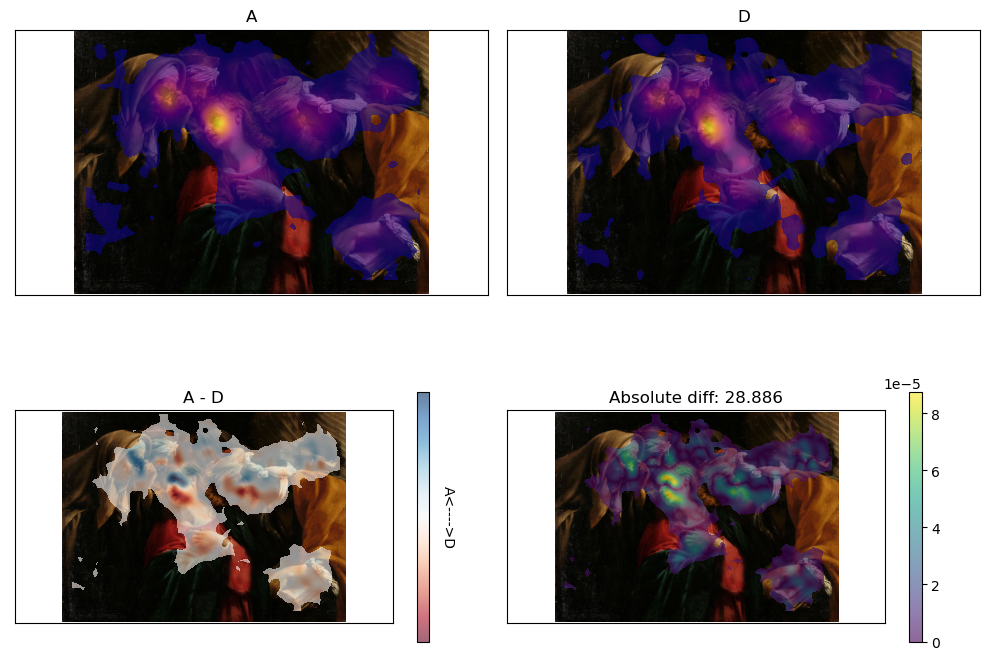

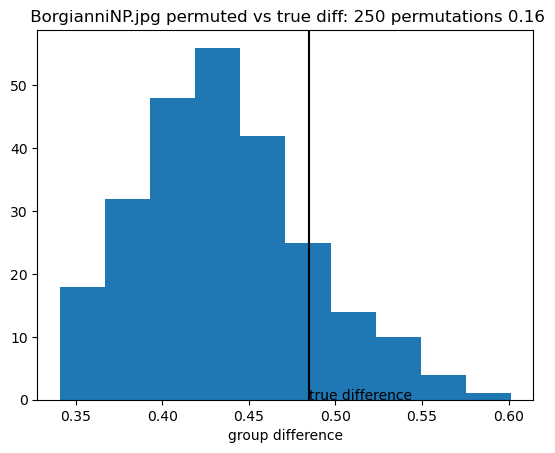

Conditions ['A' 'D']
stimns found: [1] CaravaggioP.jpg
dimensions= (66, 1929, 2134)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A CaravaggioP.jpg
1 D CaravaggioP.jpg
250 permutations starting


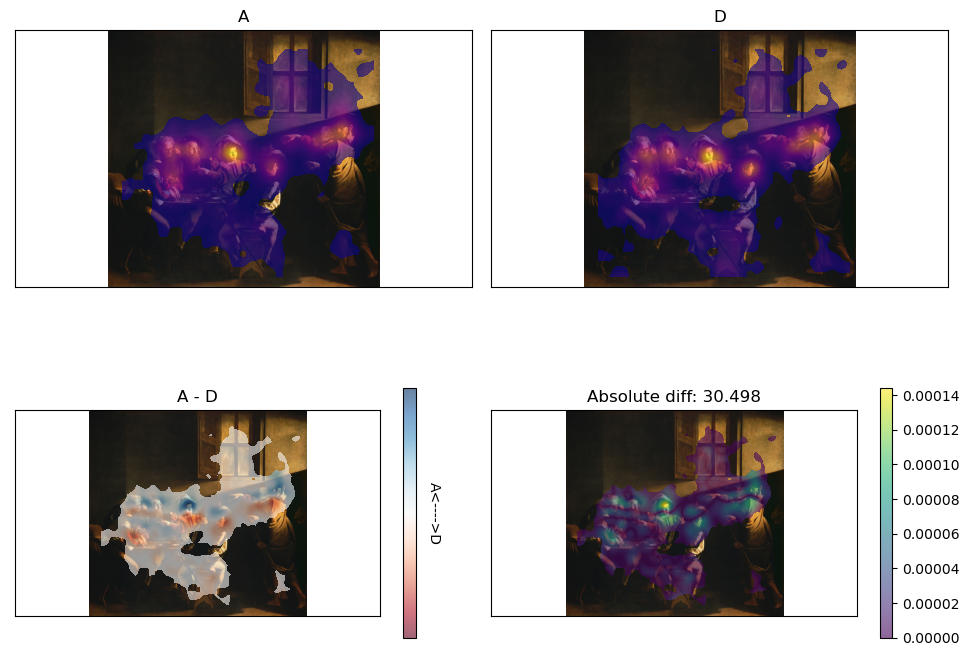

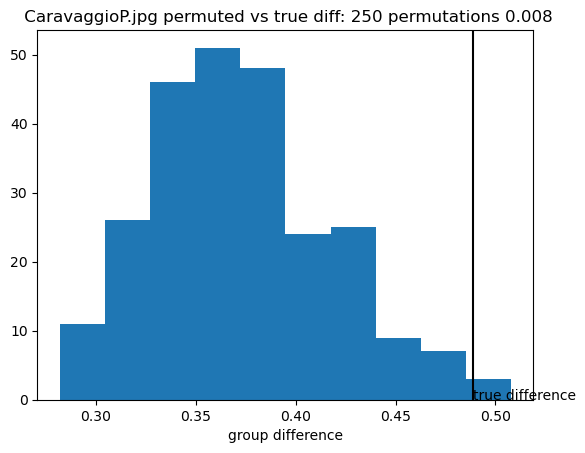

Conditions ['A' 'D']
stimns found: [2] ChampaigneNP.jpg
dimensions= (66, 1944, 2737)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A ChampaigneNP.jpg
1 D ChampaigneNP.jpg
250 permutations starting


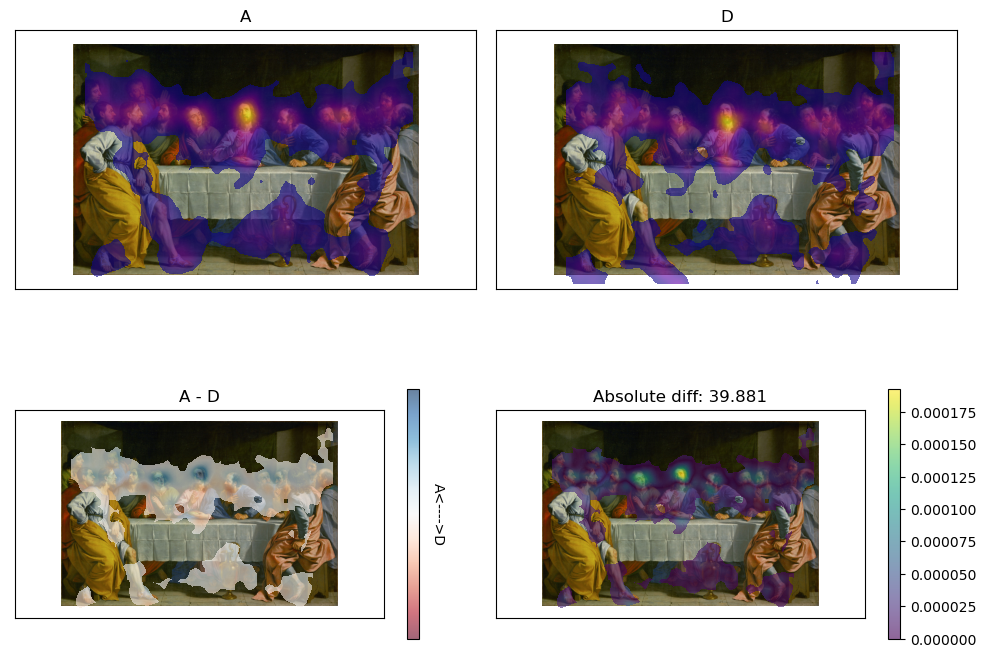

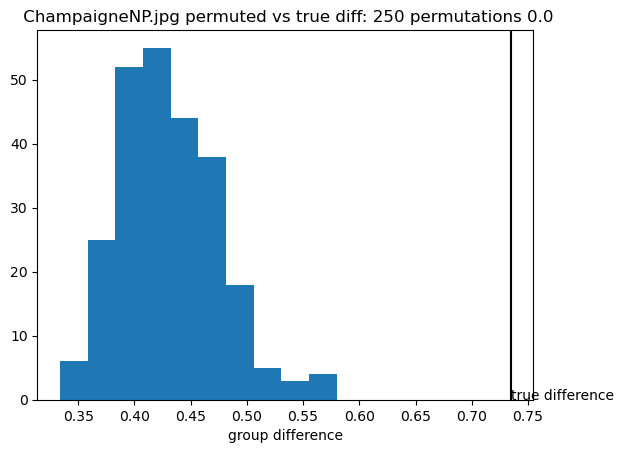

Conditions ['A' 'D']
stimns found: [3] DujardinP.jpg
dimensions= (66, 2102, 2111)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A DujardinP.jpg
1 D DujardinP.jpg
250 permutations starting


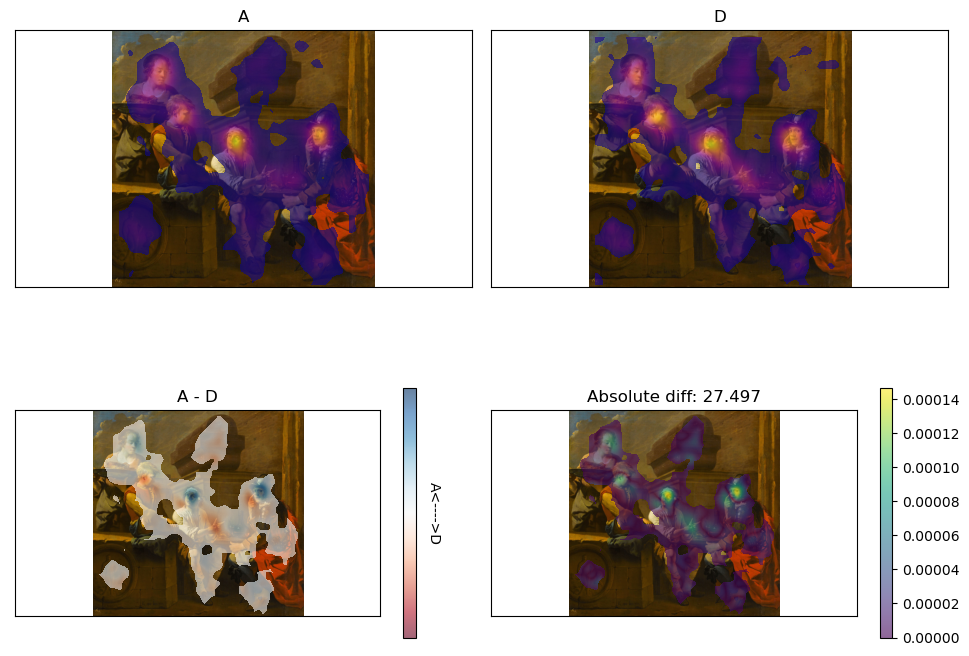

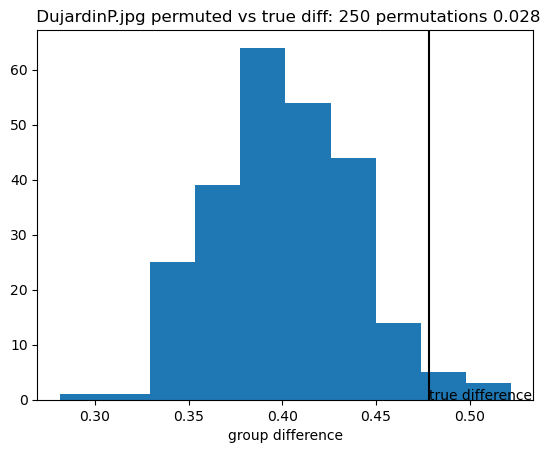

Conditions ['A' 'D']
stimns found: [4] ElymasP.jpg
dimensions= (66, 2112, 2749)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A ElymasP.jpg
1 D ElymasP.jpg
250 permutations starting


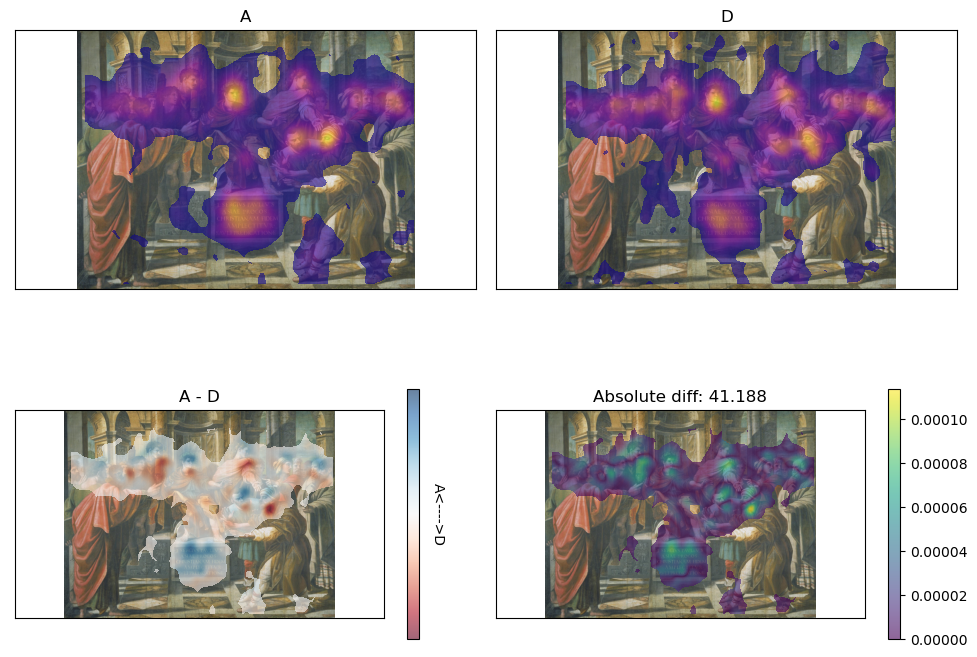

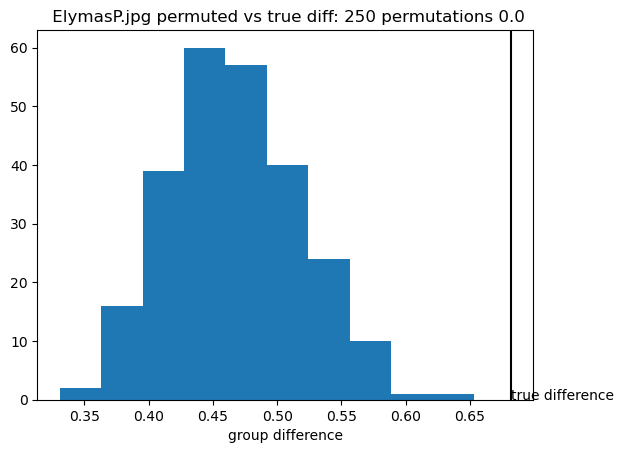

Conditions ['A' 'D']
stimns found: [5] GiorgioneP.jpg
dimensions= (66, 1988, 2725)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A GiorgioneP.jpg
1 D GiorgioneP.jpg
250 permutations starting


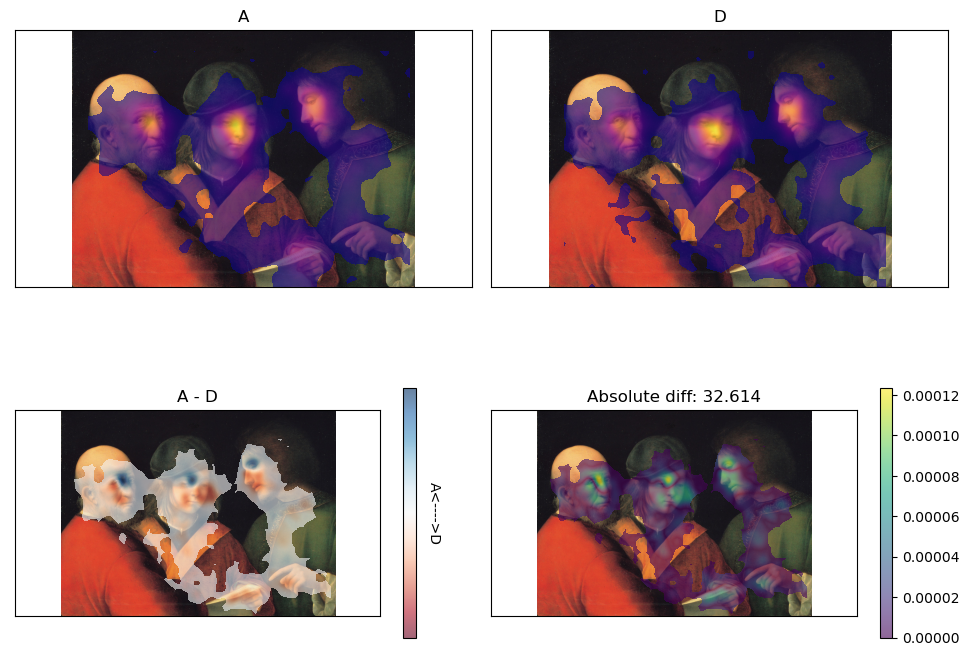

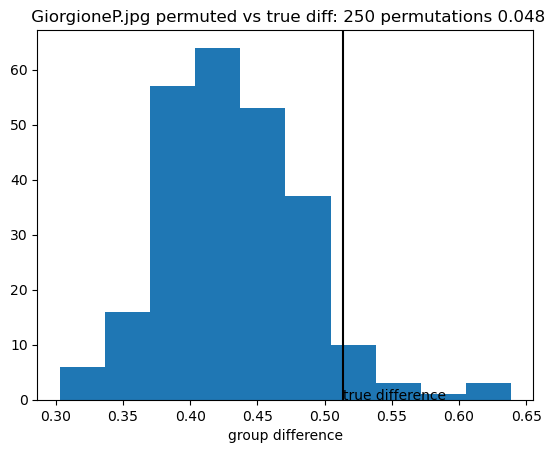

Conditions ['A' 'D']
stimns found: [6] IsaacNP.jpg
dimensions= (66, 2129, 2697)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A IsaacNP.jpg
1 D IsaacNP.jpg
250 permutations starting


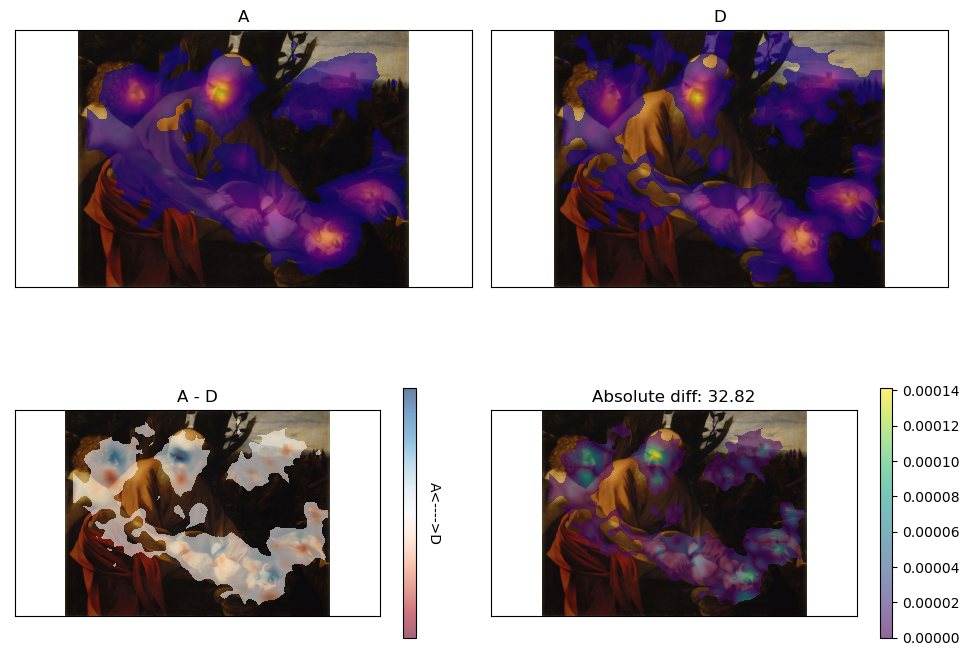

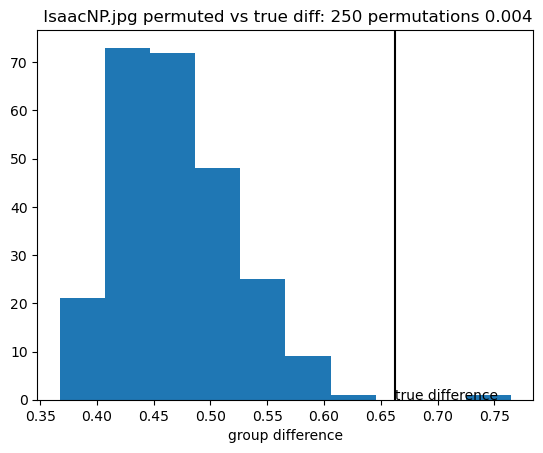

Conditions ['A' 'D']
stimns found: [7] LeonardoNP.jpg
dimensions= (66, 2150, 1309)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A LeonardoNP.jpg
1 D LeonardoNP.jpg
250 permutations starting


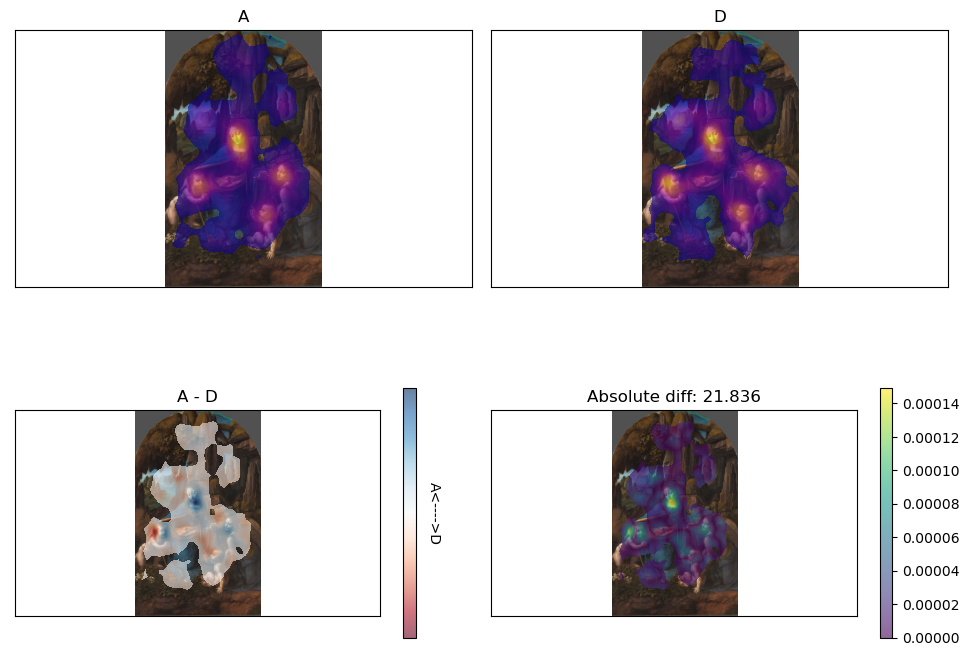

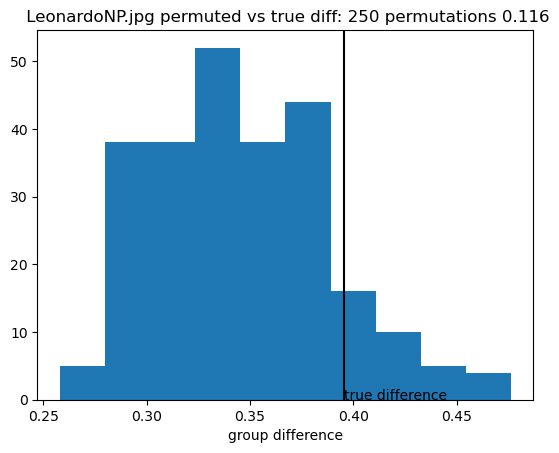

Conditions ['A' 'D']
stimns found: [8] LuiniP.jpg
dimensions= (66, 2142, 2583)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A LuiniP.jpg
1 D LuiniP.jpg
250 permutations starting


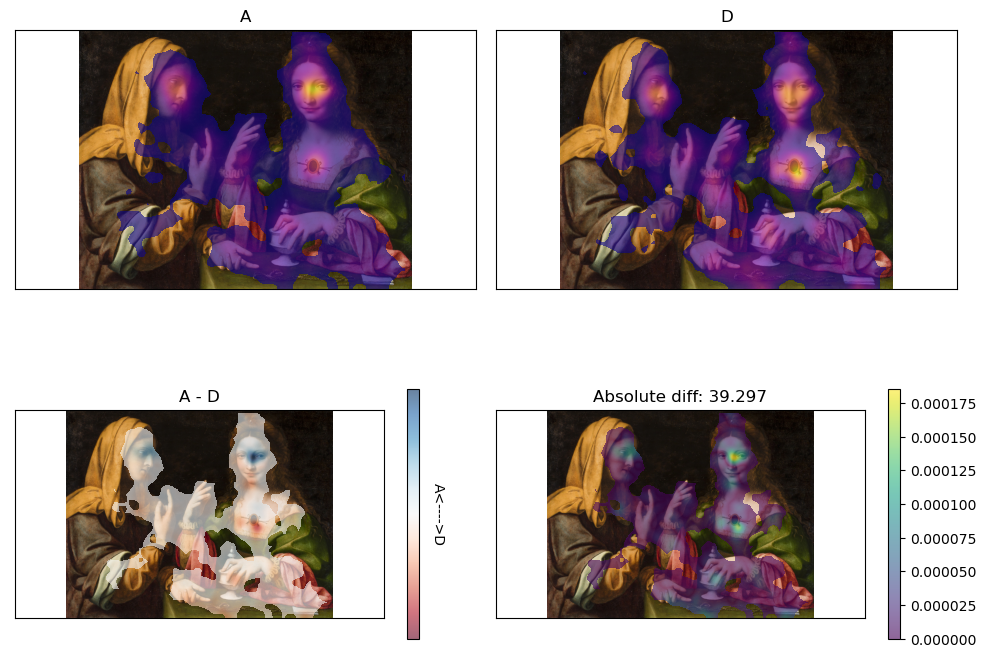

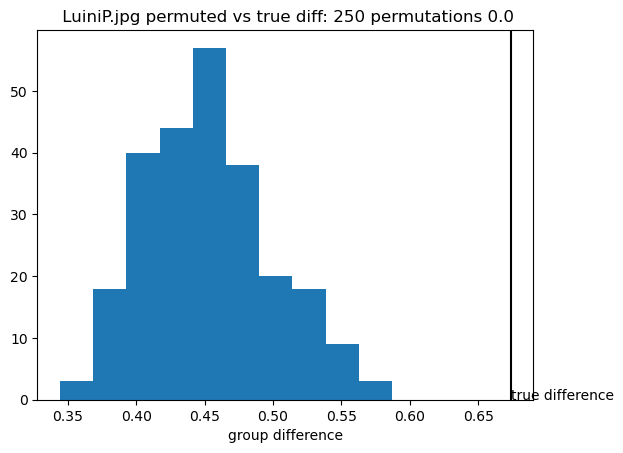

Conditions ['A' 'D']
stimns found: [9] NavarretteNP.jpg
dimensions= (66, 2122, 1792)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A NavarretteNP.jpg
1 D NavarretteNP.jpg
250 permutations starting


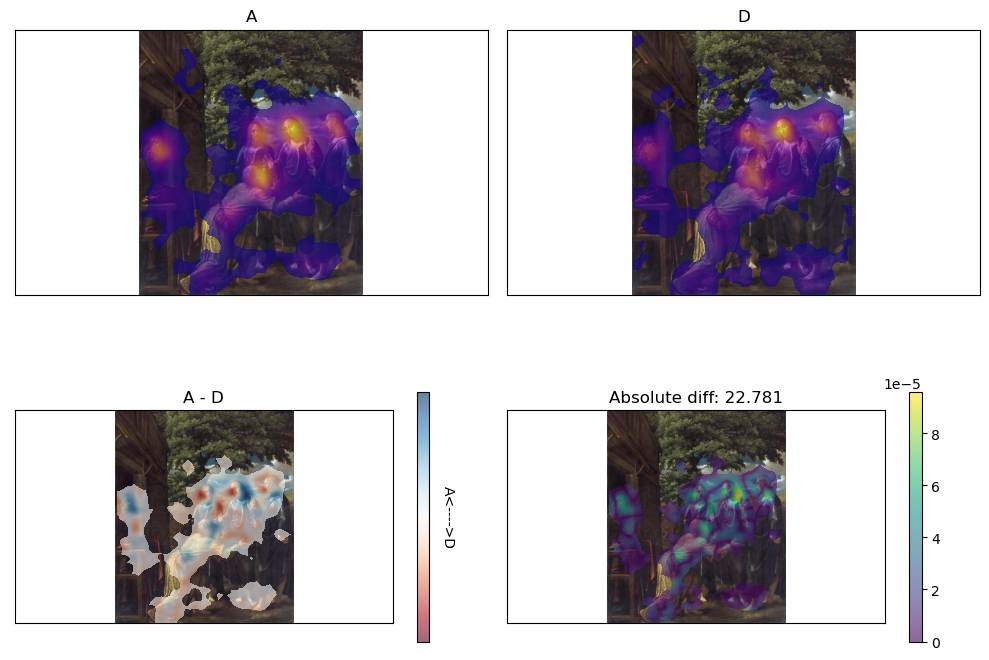

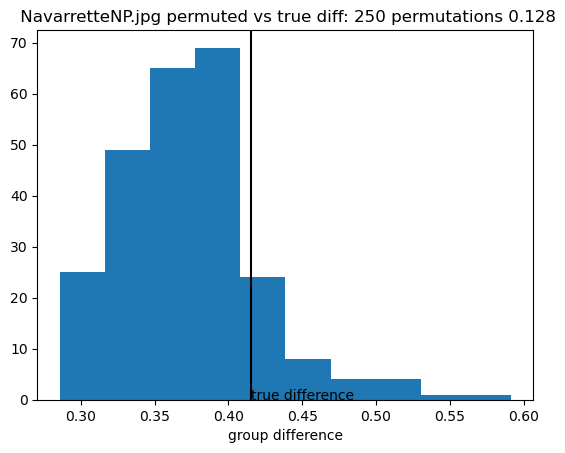

Conditions ['A' 'D']
stimns found: [10] RaphaelNP.jpg
dimensions= (66, 2147, 1551)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A RaphaelNP.jpg
1 D RaphaelNP.jpg
250 permutations starting


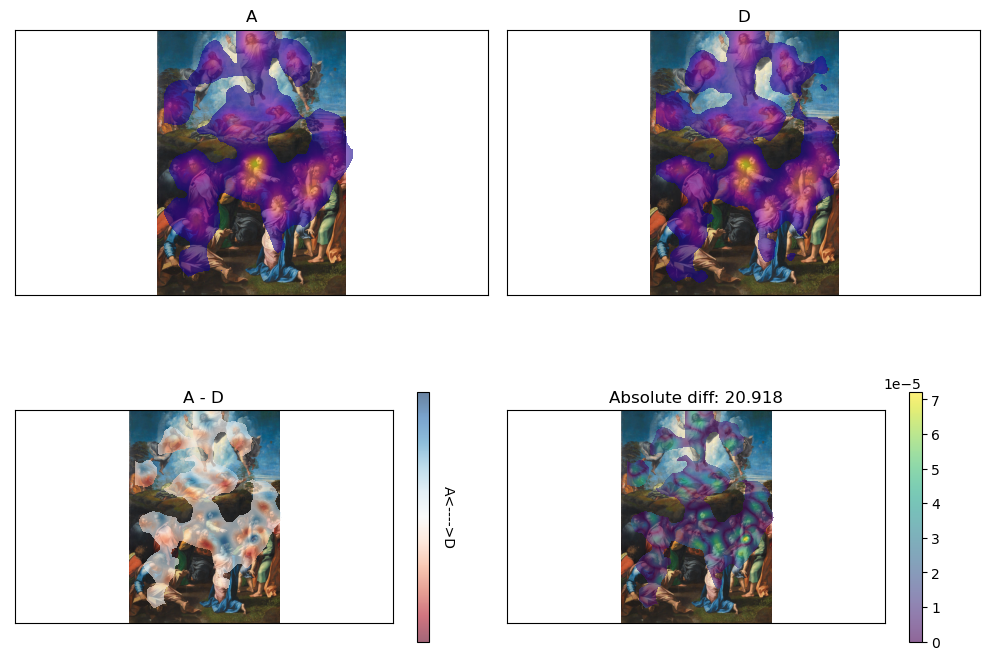

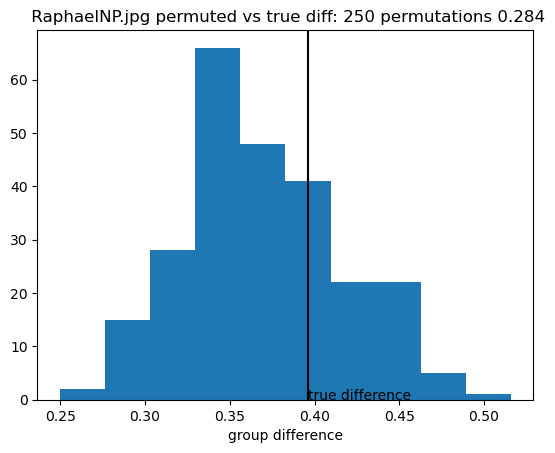

Conditions ['A' 'D']
stimns found: [11] RembrandtP.jpg
dimensions= (66, 2039, 1828)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A RembrandtP.jpg
1 D RembrandtP.jpg
250 permutations starting


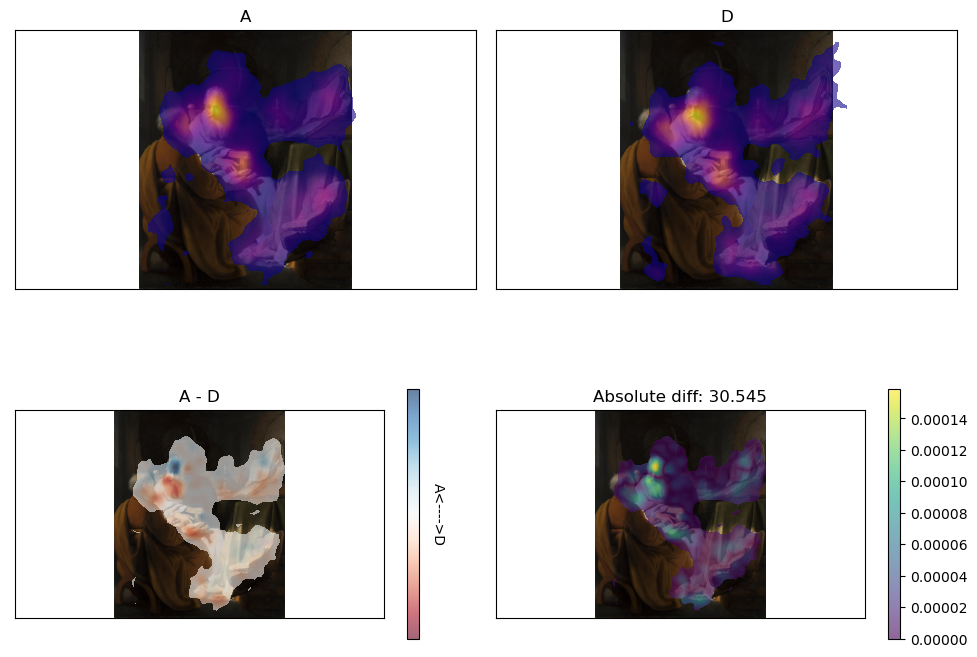

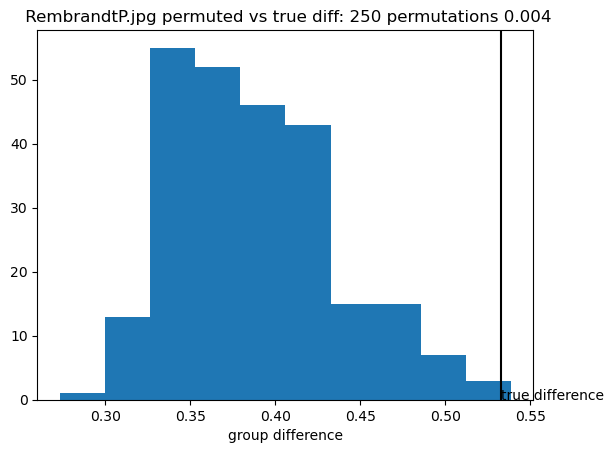

Conditions ['A' 'D']
stimns found: [12] RomboutsNP.jpg
dimensions= (66, 1623, 2511)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A RomboutsNP.jpg
1 D RomboutsNP.jpg
250 permutations starting


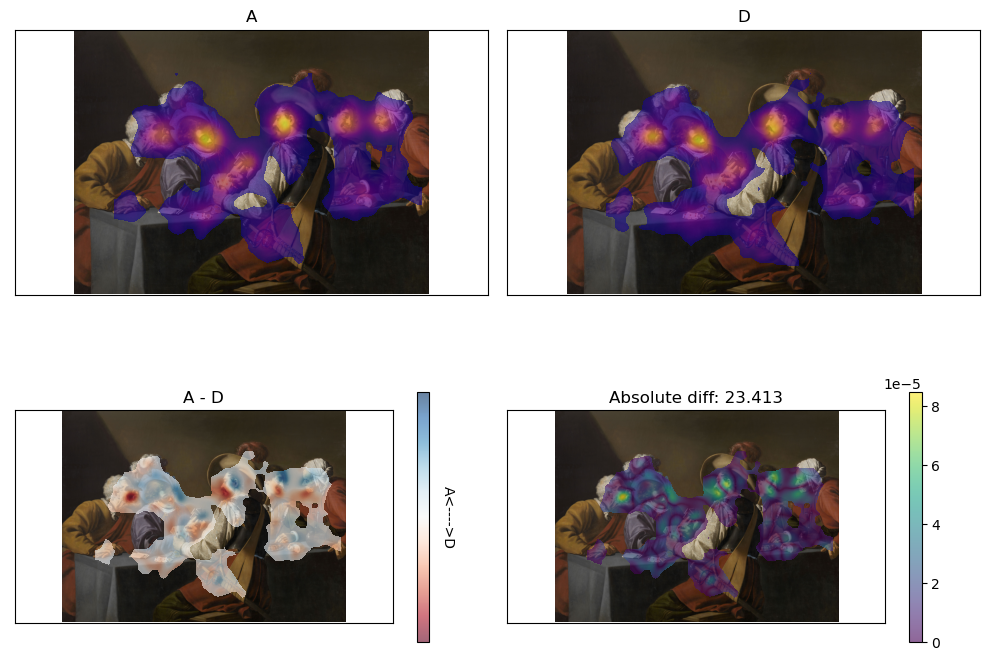

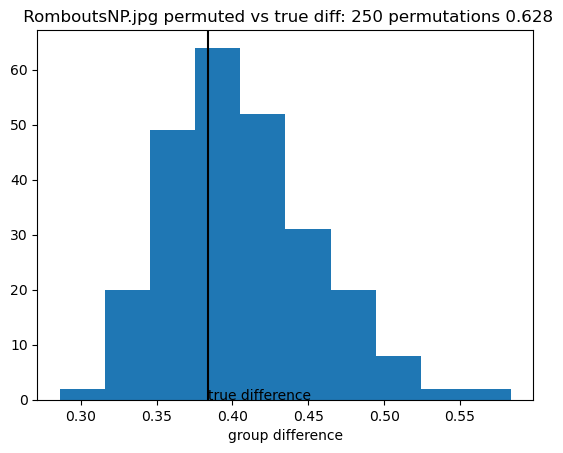

Conditions ['A' 'D']
stimns found: [13] SeghersP.jpg
dimensions= (66, 1933, 2560)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A SeghersP.jpg
1 D SeghersP.jpg
250 permutations starting


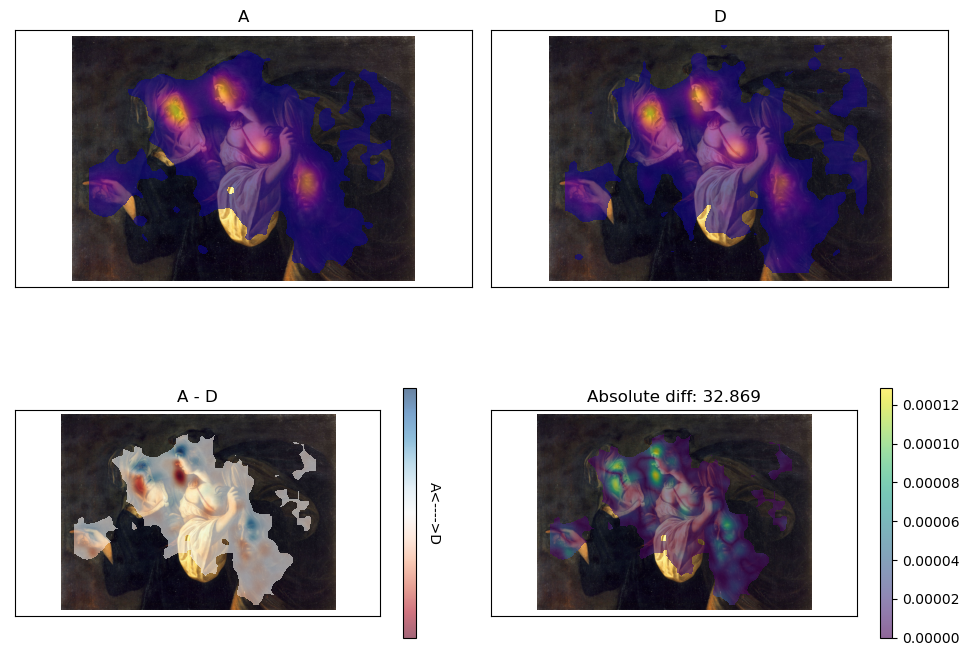

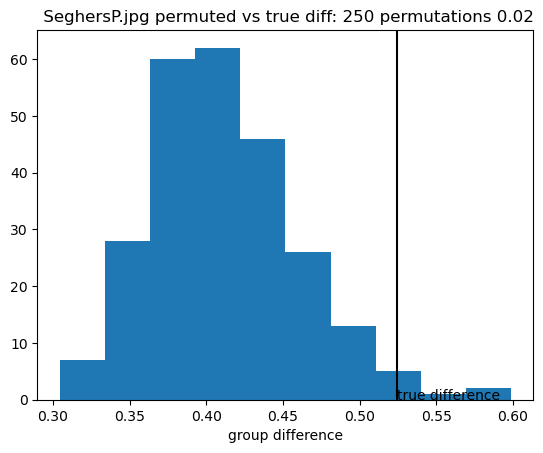

Conditions ['A' 'D']
stimns found: [14] VerdierP.jpg
dimensions= (66, 2160, 1356)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A VerdierP.jpg
1 D VerdierP.jpg
250 permutations starting


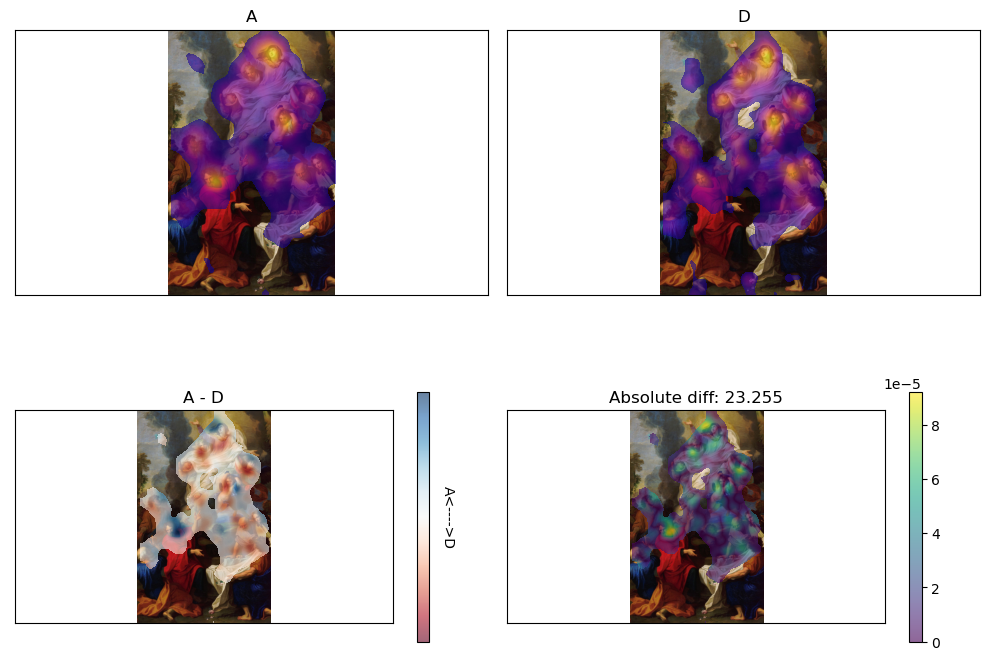

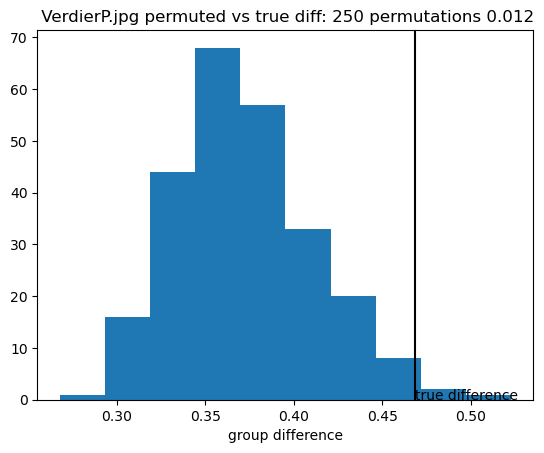

Conditions ['A' 'D']
stimns found: [15] VerrocchioNP.jpg
dimensions= (66, 2134, 1898)
num observers in group 1: {N1}
num observers in group 2: {N2}
0 A VerrocchioNP.jpg
1 D VerrocchioNP.jpg
250 permutations starting


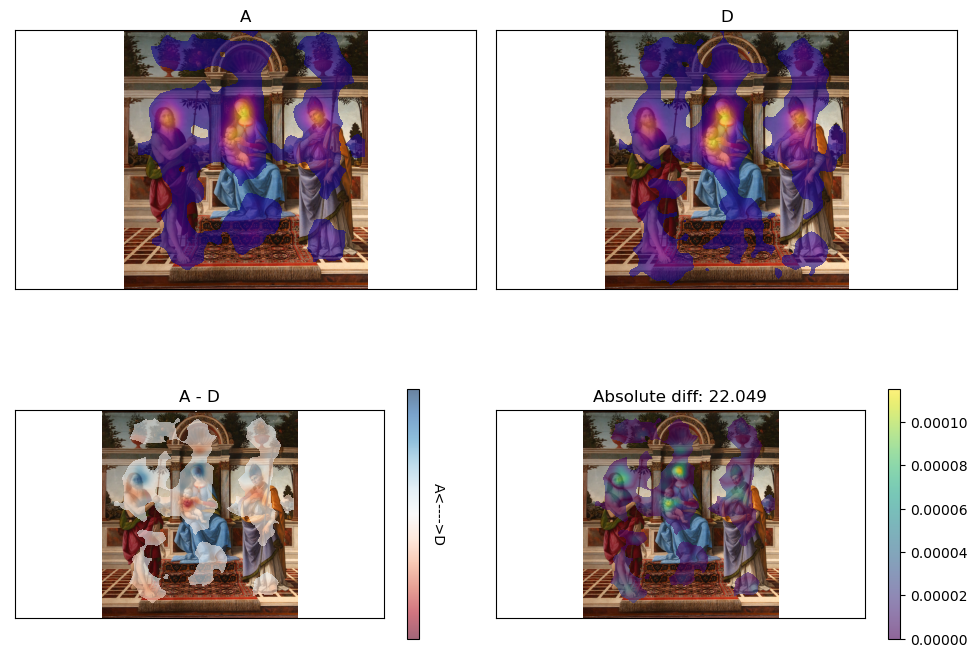

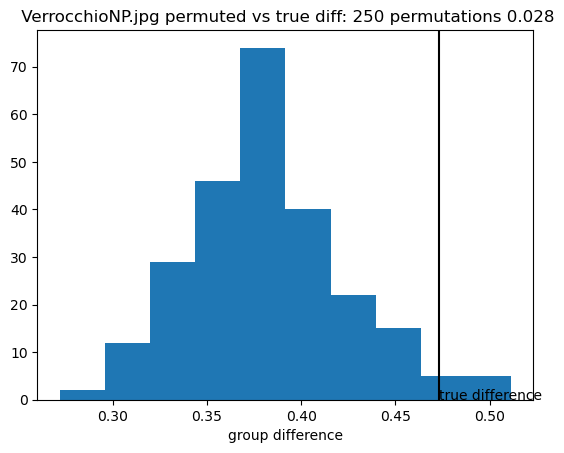

In [ ]:
Nrand=250
diffs,reddifs,permdiffs=np.zeros(SilentAD.np),np.zeros(SilentAD.np),np.zeros((Nrand,SilentAD.np))

for cs,s in enumerate(SilentAD.stimuli):
    diffs[cs],reddifs[cs],permdiffs[:,cs]=SilentAD.CompareGroupsHeatmap(s,'group',center=True,SD=40,cmap='plasma',alpha=.6,CutArea=True,Nrand=Nrand)
    plt.show()

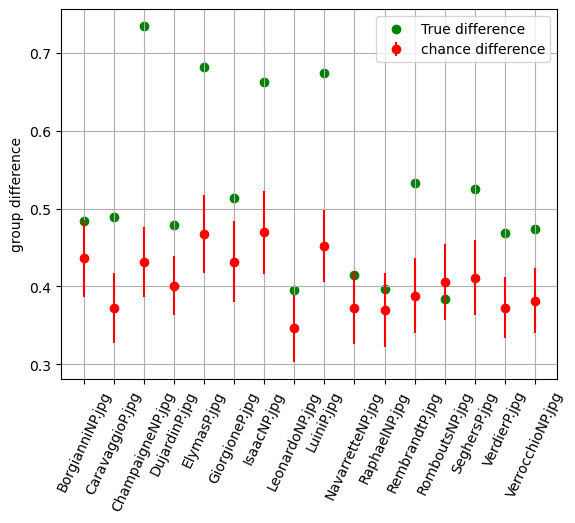

In [ ]:
fig,ax=plt.subplots()
ax.scatter(np.arange(SilentAD.np),reddifs,color='g',label='true difference')
ax.errorbar(np.arange(SilentAD.np),np.mean(permdiffs,0),np.std(permdiffs,0),color='r',marker='o',linestyle='none',label='chance difference')
ax.set_ylabel('group difference')
x=ax.set_xticks(np.arange(SilentAD.np),SilentAD.stimuli,rotation=65)
ax.legend()
ax.grid(True)

Conditions ['A' 'D']
Calculating entropy
stimns found: [0] BorgianniNP.jpg
0 BorgianniNP.jpg 6.45 maximum entropy 7.68
stimns found: [1] CaravaggioP.jpg
1 CaravaggioP.jpg 5.78 maximum entropy 7.38
stimns found: [2] ChampaigneNP.jpg
2 ChampaigneNP.jpg 6.52 maximum entropy 7.63
stimns found: [3] DujardinP.jpg
3 DujardinP.jpg 6.05 maximum entropy 7.48
stimns found: [4] ElymasP.jpg
4 ElymasP.jpg 6.57 maximum entropy 7.73
stimns found: [5] GiorgioneP.jpg
5 GiorgioneP.jpg 6.26 maximum entropy 7.65
stimns found: [6] IsaacNP.jpg
6 IsaacNP.jpg 6.46 maximum entropy 7.71
stimns found: [7] LeonardoNP.jpg


C:\Users\aratoj87\Anaconda3\envs\pymc_env\Lib\site-packages\scipy\stats\_entropy.py:135: RuntimeWarning: invalid value encountered in divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


7 LeonardoNP.jpg 1.36 maximum entropy 7.0
stimns found: [8] LuiniP.jpg
8 LuiniP.jpg 6.55 maximum entropy 7.67
stimns found: [9] NavarretteNP.jpg
9 NavarretteNP.jpg 5.66 maximum entropy 7.29
stimns found: [10] RaphaelNP.jpg
10 RaphaelNP.jpg 4.77 maximum entropy 7.17
stimns found: [11] RembrandtP.jpg
11 RembrandtP.jpg 5.66 maximum entropy 7.27
stimns found: [12] RomboutsNP.jpg
12 RomboutsNP.jpg 5.99 maximum entropy 7.38
stimns found: [13] SeghersP.jpg
13 SeghersP.jpg 6.18 maximum entropy 7.57
stimns found: [14] VerdierP.jpg
14 VerdierP.jpg 3.63 maximum entropy 7.06
stimns found: [15] VerrocchioNP.jpg
15 VerrocchioNP.jpg 5.91 maximum entropy 7.35
0 A num participants:  42
0 A Num fix=  100.83 +/- 16.42
0 A Entropy=  3.62 +/- 0.2
0 A tot scanpath len =  35654.44 +/- 7342.33 pix
0 A saccade amplitude =  358.4 +/- 58.13 pix

1 D num participants:  24
1 D Num fix=  111.53 +/- 19.46
1 D Entropy=  3.67 +/- 0.17
1 D tot scanpath len =  35003.91 +/- 6608.96 pix
1 D saccade amplitude =  323.61 +/-

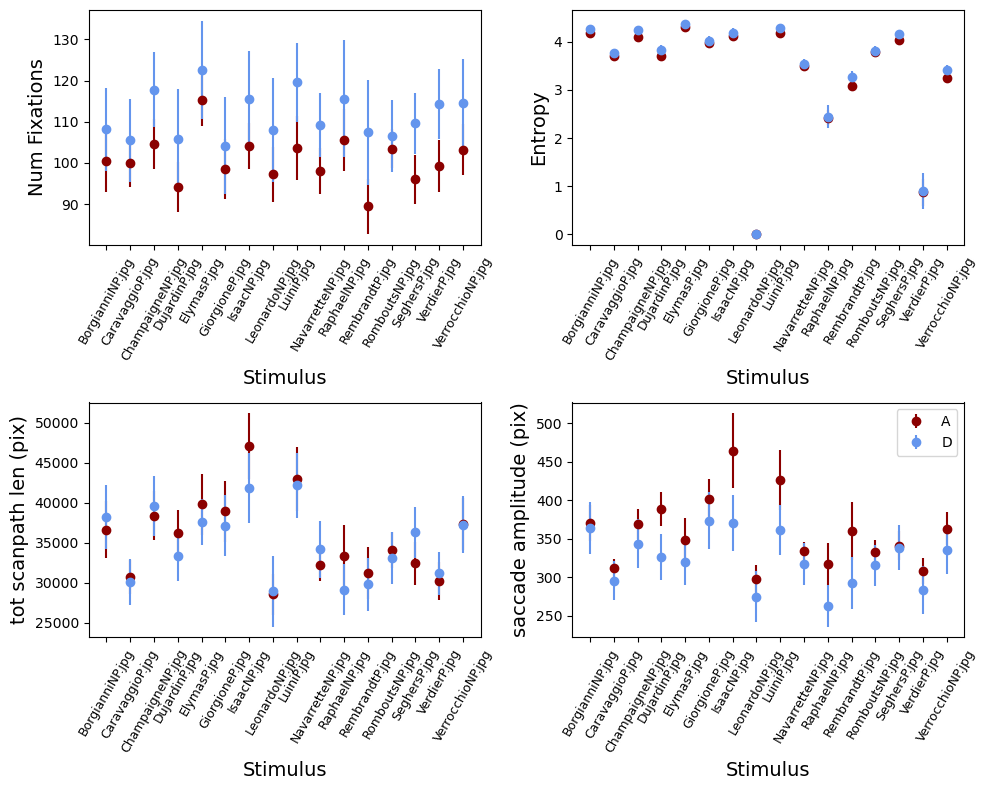

In [ ]:
SilentAD.CompareGroupsFix('group')

(66, 16, 20)
running between group comparison
Conditions ['A' 'D']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.] ['A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D'
 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D']


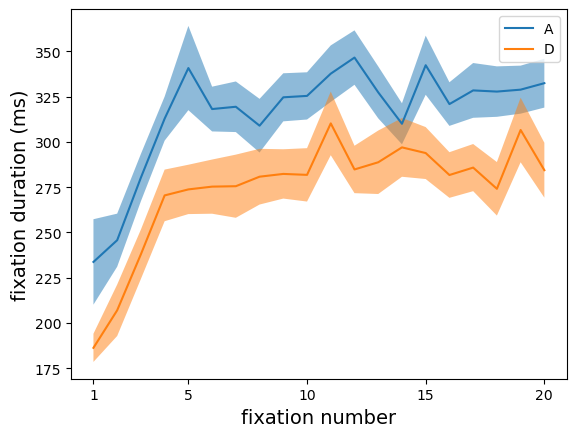

In [ ]:
SilentAD.FixDurProgGroups('group',nfixmax=20,between=True)

(66, 16, 50)
running between group comparison
Conditions ['A' 'D']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.] ['A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D'
 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D']
['A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A' 'A'
 'A' 'A' 'A' 'A' 'A' 'A' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D'
 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D' 'D']
group 0 A
group 1 D


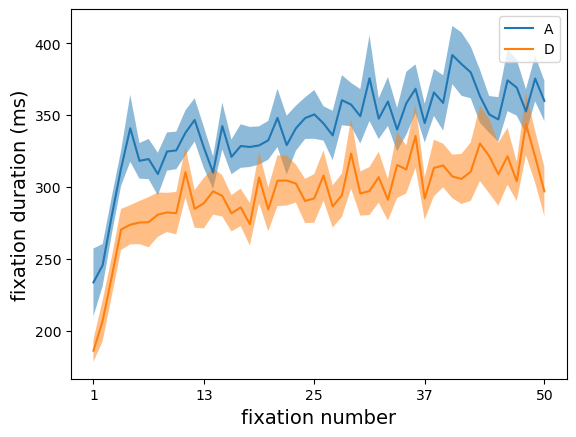

In [ ]:
SilentAD.FixDurProgGroups('group',nfixmax=50,between=True)

In [ ]:
SilentAD.BinnedDescriptivesGroupss('group',nfixmax=20,between=True)

stimns found: [0] BorgianniNP.jpg


array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

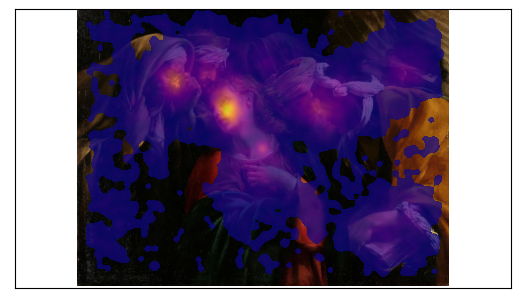

In [ ]:
SilentAD.Heatmap(SilentAD.stimuli[0],Vis=True,alpha=.7,center=True)

stimns found: [14] VerdierP.jpg


array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

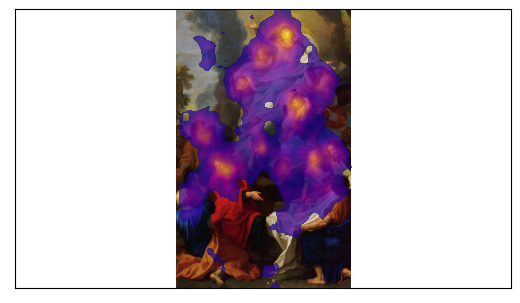

In [ ]:

SilentAD.Heatmap('VerdierP.jpg',Vis=True,alpha=.7,center=True,CutArea=True)

In [ ]:
Fixies3groups.loc[:,'image']=Fixies3groups.image_1
Fixies3groups.loc[:,'image']=Fixies3groups.image.str.replace('NP.jpg','.jpg')
Fixies3groups.loc[:,'image']=Fixies3groups.image.str.replace('P.jpg','.jpg')
SilentAB_Merge=EyeData('IntDat','Between',Fixies3groups,sizeX,sizeY,fixdata=1)
SilentAB_Merge.DataInfo(Stimulus='image',subjectID='RECORDING_SESSION_LABEL',mean_x='CURRENT_FIX_X',mean_y='CURRENT_FIX_Y',FixDuration='CURRENT_FIX_DURATION')


C:\Users\aratoj87\AppData\Local\Temp\ipykernel_16844\2046897307.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  Fixies3groups.loc[:,'image']=Fixies3groups.image.str.replace('NP.jpg','.jpg')
C:\Users\aratoj87\AppData\Local\Temp\ipykernel_16844\2046897307.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  Fixies3groups.loc[:,'image']=Fixies3groups.image.str.replace('P.jpg','.jpg')


Fixation dataset IntDat
dataset size:  (183688, 8)
study design:  Between
presentation size:  x= 3840 pixels y= 2160  pixels
presentation size:  x= 3840 pixels y= 2160  pixels
Stimulus  not found !!, provide column as Stimulus =YourColumn , default:  Stimulus
subjectID  not found !!, provide column as subjectID =YourColumn , default:  subjectID
mean_x  not found !!, provide column as mean_x =YourColumn , default:  mean_x
mean_y  not found !!, provide column as mean_y =YourColumn , default:  mean_y
info found for 109 subjects, and 16 stimuli
Stim path not provided


Data for  109 observers and  16  stimuli.
Mean fixation number:  105.33  +/-  16.94
Mean fixation duration:  342.8  +/-  69.6 msec
Num of trials with zero fixations: 0
Num valid trials  1744
Mean X location:  1970.7  +/-  57.2  pixels
Mean Y location:  1000.7  +/-  76.1  pixels
Mean saccade  amplitude:  345.5  +/-  57.2  pixels
Mean scanpath  length:  35782.3  +/-  7326.3  pixels


(array(['Borgianni.jpg', 'Caravaggio.jpg', 'Champaigne.jpg',
        'Dujardin.jpg', 'Elymas.jpg', 'Giorgione.jpg', 'Isaac.jpg',
        'Leonardo.jpg', 'Luini.jpg', 'Navarrette.jpg', 'Raphael.jpg',
        'Rembrandt.jpg', 'Rombouts.jpg', 'Seghers.jpg', 'Verdier.jpg',
        'Verrocchio.jpg'], dtype=object),
 array(['A_p03', 'A_p05', 'A_p06', 'A_p116', 'A_p119', 'A_p15', 'A_p18',
        'A_p19', 'A_p20', 'A_p22', 'A_p23', 'A_p24', 'A_p31', 'A_p32',
        'A_p35', 'A_p36', 'A_p37', 'A_p45', 'A_p47', 'A_p48', 'A_p54',
        'A_p55', 'A_p65', 'A_p66', 'A_p67', 'A_p69', 'A_p70', 'A_p71',
        'A_p72', 'A_p73', 'A_p75', 'A_p76', 'A_p85', 'A_p86', 'A_p87',
        'A_p88', 'A_p89', 'A_p90', 'A_p96', 'A_p97', 'A_p98', 'A_p99',
        'B_p09', 'B_p10', 'B_p102', 'B_p103', 'B_p108', 'B_p109', 'B_p11',
        'B_p110', 'B_p111', 'B_p121', 'B_p122', 'B_p124', 'B_p13', 'B_p28',
        'B_p29', 'B_p30', 'B_p38', 'B_p39', 'B_p41', 'B_p42', 'B_p44',
        'B_p49', 'B_p51', 'B_p52', 'B_

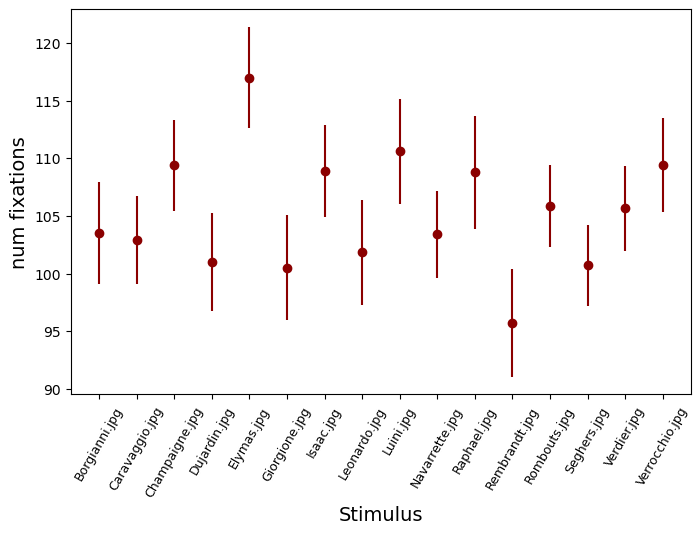

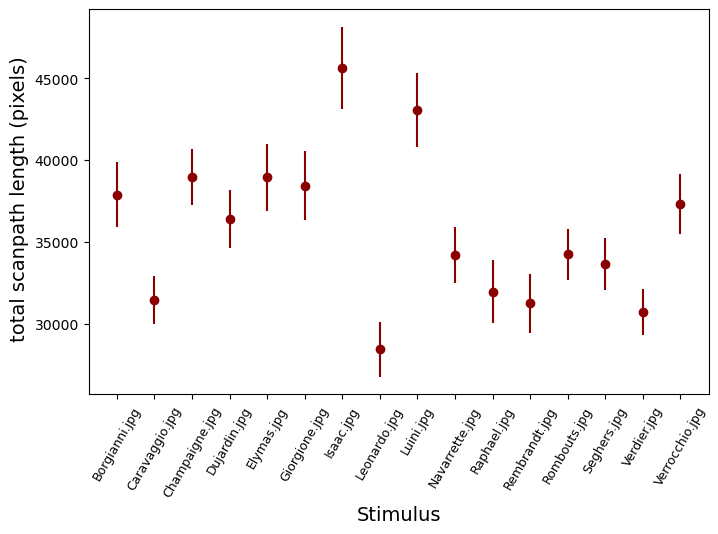

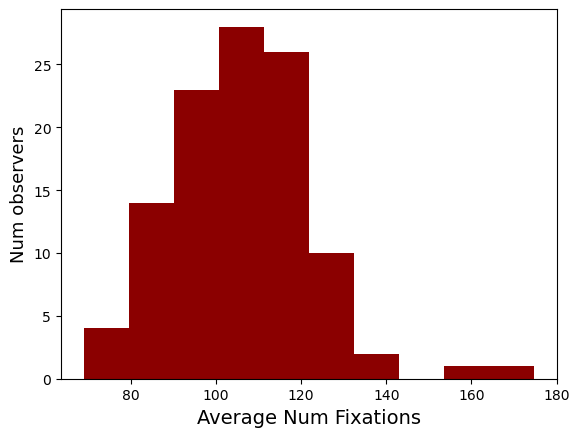

In [ ]:
SilentAB_Merge.RunDescriptiveFix(Visual=1,duration=1)

Conditions ['A' 'B' 'D']
0 A num participants:  42
0 A Num fix=  100.83 +/- 16.42
0 A Entropy=  3.62 +/- 0.21
0 A tot scanpath len =  35654.44 +/- 7342.33 pix
0 A saccade amplitude =  358.4 +/- 58.13 pix

1 B num participants:  43
1 B Num fix=  106.26 +/- 14.5
1 B Entropy=  3.64 +/- 0.2
1 B tot scanpath len =  36341.53 +/- 7639.13 pix
1 B saccade amplitude =  345.23 +/- 50.17 pix

2 D num participants:  24
2 D Num fix=  111.53 +/- 19.46
2 D Entropy=  3.69 +/- 0.18
2 D tot scanpath len =  35003.91 +/- 6608.96 pix
2 D saccade amplitude =  323.61 +/- 60.69 pix


 
Overall group differences:  A vs B
Entropy t= -0.3961 , p= 0.6931
Num Fix t= -1.5987 , p=  0.1137
Scanpath lengths t= -0.4176 , p= 0.6773
Saccade amplitudes t= 1.1059 , p= 0.272
 

 
Overall group differences:  A vs D
Entropy t= -1.2905 , p= 0.2015
Num Fix t= -2.3424 , p=  0.0223
Scanpath lengths t= 0.3534 , p= 0.725
Saccade amplitudes t= 2.2664 , p= 0.0268
 

 
Overall group differences:  B vs D
Entropy t= -1.0048 , p= 0.3187
N

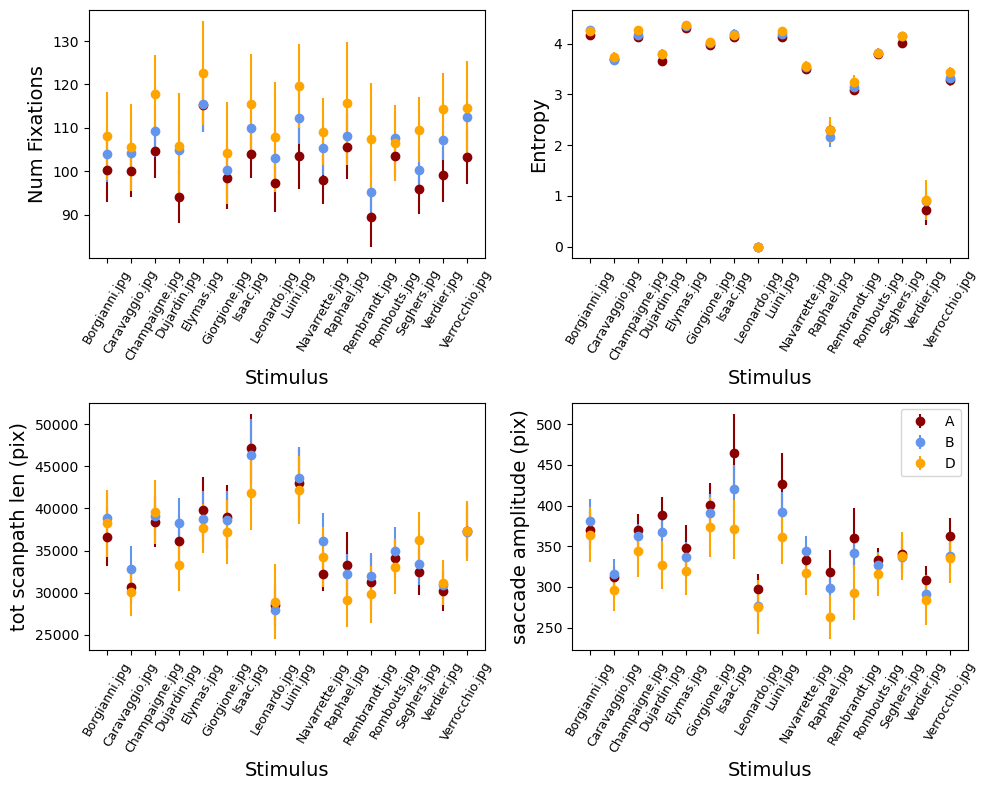

In [ ]:
SilentAB_Merge.CompareGroupsFix('group')

(109, 16, 10)
Conditions ['A' 'B' 'D']
group 0 A
group 1 B
group 2 D


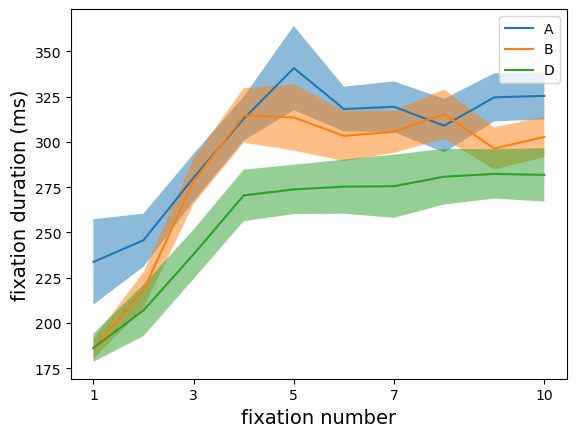

In [ ]:
SilentAB_Merge.FixDurProgGroups('group',nfixmax=10,between=True)

In [ ]:
SilentAB_Merge.data

,image_1,subjectID,CURRENT_FIX_START,mean_x,mean_y,duration,group,pointing,Stimulus
0,IsaacNP.jpg,A_p03,70,1920.0,1066.0,147,A,False,Isaac.jpg
1,IsaacNP.jpg,A_p03,250,1808.0,688.0,134,A,False,Isaac.jpg
2,IsaacNP.jpg,A_p03,414,1759.0,383.0,231,A,False,Isaac.jpg
3,IsaacNP.jpg,A_p03,709,2445.0,1611.0,202,A,False,Isaac.jpg
4,IsaacNP.jpg,A_p03,935,2561.0,1656.0,131,A,False,Isaac.jpg
...,...,...,...,...,...,...,...,...,...
80694,SeghersP.jpg,D_p28,34215,2422.0,1377.0,733,D,True,Seghers.jpg
80695,SeghersP.jpg,D_p28,34963,2420.0,1414.0,3515,D,True,Seghers.jpg
80696,SeghersP.jpg,D_p28,38499,2392.0,1437.0,37,D,True,Seghers.jpg
80697,SeghersP.jpg,D_p28,38554,2377.0,1532.0,633,D,True,Seghers.jpg


Bins [    0  5000 10000 15000 20000 25000 30000]
from 0 to 5000 found:  27101


C:\Users\aratoj87\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\aratoj87\Anaconda3\envs\pymc_env\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


from 5000 to 10000 found:  24129
from 10000 to 15000 found:  23328
from 15000 to 20000 found:  22509
from 20000 to 25000 found:  21981
from 25000 to 30000 found:  21723


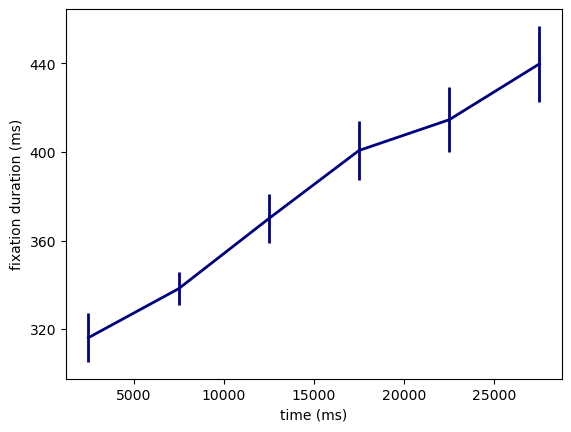

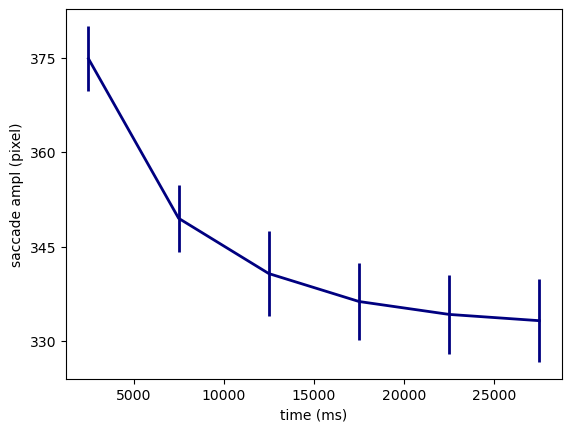

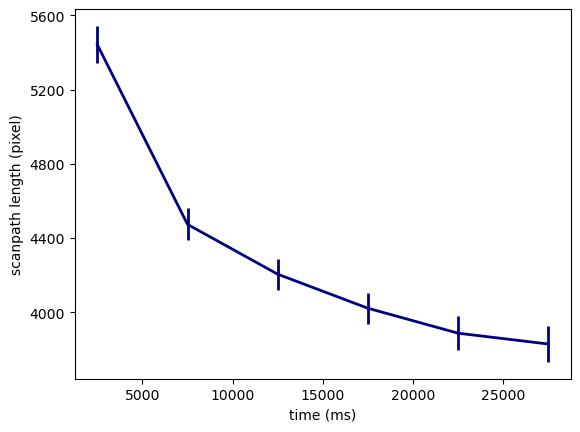

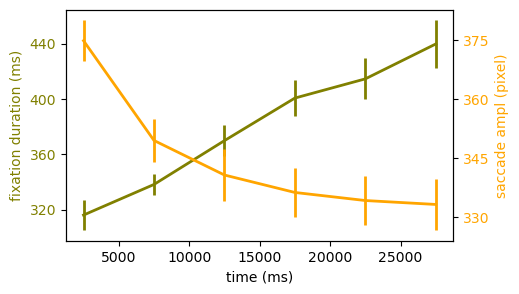

In [ ]:
SilentAB_Merge.BinnedDescriptives(30000,5000,'CURRENT_FIX_START','duration',startime=0)

Conditions ['A' 'B' 'D']
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41]
[42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65
 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84]
[ 85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105 106 107 108]


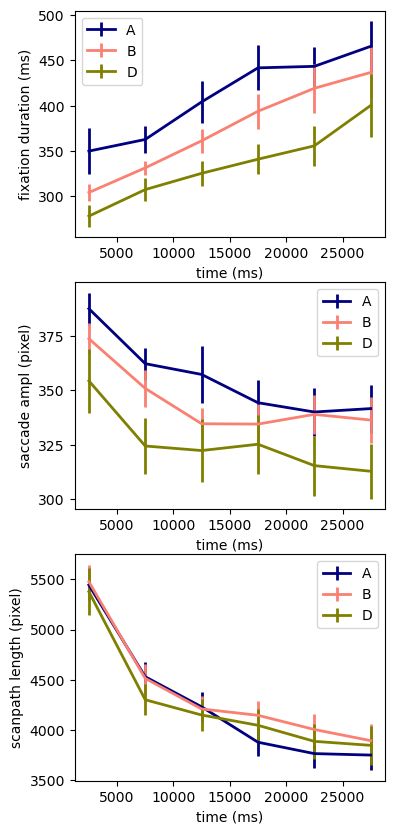

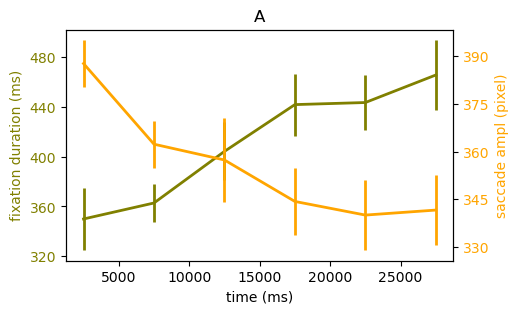

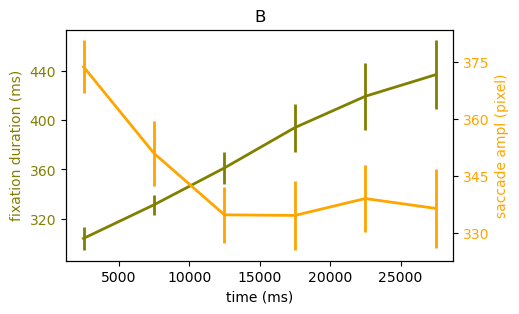

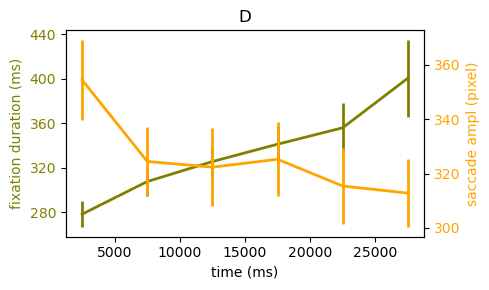

In [ ]:
SilentAB_Merge.BinnedDescriptivesGroups('group',between=True)